In [1]:
%matplotlib inline

In [2]:
from datetime import datetime
import os
from os.path import dirname, abspath, join
from os import getcwd
import sys

In [3]:
import random
import string
import pandas as pd
import numpy as np

In [4]:
np.set_printoptions(formatter={'float': '{: 0.3f}'.format})

In [5]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

In [6]:
import torch
import socket
from IPython.display import clear_output

In [7]:
import itertools
import multiprocessing as mp

In [8]:
# seed_arg = int(sys.argv[1])
# print ("\n\nSeed ARG: ",seed_arg)
seed_arg = 0

In [9]:
seedlist = np.array([161, 314, 228, 271828, 230, 4271031, 5526538, 6610165, 9849252, 34534, 73422, 8765])
seed = seedlist[seed_arg]
random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
np.random.seed(seed)
os.environ['PYTHONHASHSEED'] = str(seed)

In [10]:
class ENO(object):
    
    #no. of forecast types is 6 ranging from 0 to 5
  
    def __init__(self, location='tokyo', year=2010, shuffle=False, day_balance=False):
        self.location = location
        self.year = year
        self.day = None
        self.hr = None
        
        self.shuffle = shuffle
        self.day_balance = day_balance

        self.TIME_STEPS = None #no. of time steps in one episode
        self.NO_OF_DAYS = None #no. of days in one year
        
        self.NO_OF_DAYTYPE = 10 #no. of daytypes
        self.daycounter = 0 #to count number of days that have been passed
        
        self.sradiation = None #matrix with GSR for the entire year
        self.senergy = None #matrix with harvested energy data for the entire year
        self.fforecast = None #array with forecast values for each day
        

        self.henergy = None #harvested energy variable
        self.fcast = None #forecast variable
        self.sorted_days = [] #days sorted according to day type
        
        self.SMAX = 1000 # 1 Watt Solar Panel

    
    #function to get the solar data for the given location and year and prep it
    def get_data(self):
        #solar_data/CSV files contain the values of GSR (Global Solar Radiation in MegaJoules per meters squared per hour)
        #weather_data/CSV files contain the weather summary from 06:00 to 18:00 and 18:00 to 06:00+1
        location = self.location
        year = self.year

        THIS_DIR = getcwd()
        SDATA_DIR = abspath(join(THIS_DIR, 'solar_data'))  #abspath(join(THIS_DIR, '../../..', 'data'))
        
        sfile = SDATA_DIR + '/' + location +'/' + str(year) + '.csv'
        
        #skiprows=4 to remove unnecessary title texts
        #usecols=4 to read only the Global Solar Radiation (GSR) values
        solar_radiation = pd.read_csv(sfile, skiprows=4, encoding='shift_jisx0213', usecols=[4])
      
        #convert dataframe to numpy array
        solar_radiation = solar_radiation.values

        #convert missing data in CSV files to zero
        solar_radiation[np.isnan(solar_radiation)] = 0

        #reshape solar_radiation into no_of_daysx24 array
        solar_radiation = solar_radiation.reshape(-1,24)

        if(self.shuffle): #if class instatiation calls for shuffling the day order. Required when learning
            np.random.shuffle(solar_radiation) 
        self.sradiation = solar_radiation
        
        #GSR values (in MJ/sq.mts per hour) need to be expressed in mW
        # Conversion is accomplished by 
        # solar_energy = GSR(in MJ/m2/hr) * 1e6 * size of solar cell * efficiency of solar cell /(60x60) *1000 (to express in mW)
        # the factor of 2 in the end is assuming two solar cells
        self.senergy = 2*self.sradiation * 1e6 * (55e-3 * 70e-3) * 0.15 * 1000/(60*60)

        return 0
    
    #function to map total day radiation into type of day ranging from 0 to 5
    #the classification into day types is quite arbitrary. There is no solid logic behind this type of classification.
    
    def get_day_state(self,tot_day_radiation):
        bin_edges = np.array([0, 3.5, 6.5, 9.0, 12.5, 15.5, 18.5, 22.0, 25, 28])
        for k in np.arange(1,bin_edges.size):
            if (bin_edges[k-1] <= tot_day_radiation <= bin_edges[k]):
                day_state = k -1
                break
            else:
                day_state = bin_edges.size - 1
        return int(day_state)
    
    def get_forecast(self):
        #create a perfect forecaster.
        tot_day_radiation = np.sum(self.sradiation, axis=1) #contains total solar radiation for each day
        get_day_state = np.vectorize(self.get_day_state)
        self.fforecast = get_day_state(tot_day_radiation)
        
        #sort days depending on the type of day and shuffle them; maybe required when learning
        for fcast in range(0,6):
            fcast_days = ([i for i,x in enumerate(self.fforecast) if x == fcast])
            np.random.shuffle(fcast_days)
            self.sorted_days.append(fcast_days)
        return 0
    
    def reset(self,day=0): #it is possible to reset to the beginning of a certain day
        
        self.get_data() #first get data for the given year
        self.get_forecast() #calculate the forecast
        
        self.TIME_STEPS = self.senergy.shape[1]
        self.NO_OF_DAYS = self.senergy.shape[0]
        
        self.day = day
        self.hr = 0
        
        self.henergy = self.senergy[self.day][self.hr]
        self.fcast = self.fforecast[self.day]
        
        end_of_day = False
        end_of_year = False
        return [self.henergy, self.fcast, end_of_day, end_of_year]

    
    def step(self):
        end_of_day = False
        end_of_year = False
        if not(self.day_balance): #if daytype balance is not required
            if(self.hr < self.TIME_STEPS - 1):
                self.hr += 1
                self.henergy = self.senergy[self.day][self.hr] 
                self.fcast = self.fforecast[self.day]
            else:
                if(self.day < self.NO_OF_DAYS -1):
                    end_of_day = True
                    self.hr = 0
                    self.day += 1
                    self.henergy = self.senergy[self.day][self.hr] 
                    self.fcast = self.fforecast[self.day]
                else:
                    end_of_day = True
                    end_of_year = True

                    
        else: #when training, we want all daytypes to be equally represented for robust policy
              #obviously, the days are going to be in random order
            if(self.hr < self.TIME_STEPS - 1):
                self.hr += 1
                self.henergy = self.senergy[self.day][self.hr]
                self.fcast = self.fforecast[self.day]
            else:
                if(self.daycounter < self.NO_OF_DAYS -1):
                    end_of_day = True
                    self.daycounter += 1
                    self.hr = 0
                    daytype = random.choice(np.arange(0,self.NO_OF_DAYTYPE)) #choose random daytype
                    self.day = np.random.choice(self.sorted_days[daytype]) #choose random day from that daytype
                    self.henergy = self.senergy[self.day][self.hr] 
                    self.fcast = self.fforecast[self.day]
                else: 
                    end_of_day = True
                    end_of_year = True
                    self.daycounter = 0
        
        return [self.henergy, self.fcast, end_of_day, end_of_year]

In [11]:
class CAPM (object):
    def __init__(self,location='tokyo', year=2010, shuffle=False, trainmode=False):

        #all energy values i.e. BMIN, BMAX, BOPT, HMAX are in mWhr. Assuming one timestep is one hour
        
        self.BMIN = 50.0                #Minimum battery level that is tolerated. Maybe non-zero also
        self.BMAX = 10000.0            #Max Battery Level. May not necessarily be equal to total batter capacity [3.6V x 2500mAh]
        self.BOPT = 0.5 * self.BMAX    #Optimal Battery Level. Assuming 50% of battery is the optimum
        self.BLIM_LO = 0.15*self.BMAX
        self.BLIM_HI = 0.85*self.BMAX
        self.BSAFE_LO = 0.35*self.BMAX
        self.BSAFE_HI = 0.65*self.BMAX
        
        self.ENP_MARGIN = 0.3*self.BMAX

        
        self.HMIN = 0      #Minimum energy that can be harvested by the solar panel.
        self.HMAX = None   #Maximum energy that can be harvested by the solar panel. [500mW]
        
        self.DMAX = 500      #Maximum energy that can be consumed by the node in one time step. [~ 3.6V x 135mA]
        self.N_ACTIONS = 10  #No. of different duty cycles possible
        self.DMIN = self.DMAX/self.N_ACTIONS #Minimum energy that can be consumed by the node in one time step. [~ 3.6V x 15mA]
        
        self.binit = None     #battery at the beginning of day
        self.btrack = []      #track the battery level for each day
        self.v_btrack = []      #track the virtual battery level for each day

        self.atrack = []      #track the duty cycles for each day
        self.htrack = []      #track the harvested for each day
        self.batt = None      #battery variable
        self.enp = None       #enp at end of hr
        self.henergy = None   #harvested energy variable
        self.fcast = None     #forecast variable
        
        self.MUBATT = 0.6
        self.SDBATT = 0.02
        
        self.MUHENERGY = 0.5
        self.SDHENERGY = 0.2
        
        self.MUENP = 0
        self.SDENP = 0.02
        
        self.location  = location
        self.year      = year
        self.shuffle   = shuffle
        self.trainmode = trainmode
        self.eno       = None
        
        self.day_violation_flag = False
        self.violation_flag     = False
        self.violation_counter  = 0
        self.batt_full_counter  = 0
        self.batt_empty_counter = 0
        
        self.batt_violations    = 0

        self.NO_OF_DAYTYPE      = 10 #no. of daytypes
 
    def reset(self,day=0,batt=-1):
        henergy, fcast, day_end, year_end = self.eno.reset(day) #reset the eno environment
        self.violation_flag = False
        self.violation_counter = 0
        self.batt_violations = 0
        
        if(batt == -1):
            self.batt = self.BOPT
        else:
            self.batt = batt
            
        self.batt = np.clip(self.batt, self.BMIN, self.BMAX)
        self.binit = self.batt
        self.btrack = np.append(self.btrack, self.batt) #track battery levels
        self.v_btrack = np.append(self.v_btrack, self.batt) #track battery levels
#         self.enp = self.BOPT - self.batt
        self.enp = self.binit - self.batt #enp is calculated
        self.henergy = np.clip(henergy, self.HMIN, self.HMAX) #clip henergy within HMIN and HMAX
        self.fcast = fcast
        
        norm_batt    = self.batt    /self.BMAX
        norm_enp     = self.enp     /self.BMAX
        norm_henergy = self.henergy /self.HMAX
        norm_fcast   = self.fcast   /(self.NO_OF_DAYTYPE-1)
        c_state = [norm_batt, norm_enp, norm_henergy, norm_fcast] #continuous states

        reward = 0
        
        return [c_state, reward, day_end, year_end]
    
    def getstate(self): #query the present state of the system
        norm_batt    = self.batt    /self.BMAX
        norm_enp     = self.enp     /self.BMAX
        norm_henergy = self.henergy /self.HMAX
        norm_fcast   = self.fcast   /(self.NO_OF_DAYTYPE-1)
        c_state = [norm_batt, norm_enp, norm_henergy, norm_fcast] #continuous states

        return c_state
        
    
    #reward function
    def rewardfn(self):
        violation_penalty = 0
        bmean = np.mean(self.btrack)
        bdev = self.BOPT - bmean
        if np.abs(bdev) > (self.BOPT - self.ENP_MARGIN):
            reward = 1.5-np.abs(bdev)/self.BMAX*5
        else:
            reward = 1
#         reward = 2 - 20*np.abs(bdev)/self.BMAX
#         if(self.day_violation_flag):
#             violation_penalty += 3    #penalty for violating battery limits anytime during the day
        return np.clip(reward,-1,1)#(reward - violation_penalty)
    
    
    
    def step(self, action):
        day_end = False
        year_end = False
        self.violation_flag = False
        reward = 0
        self.atrack = np.append(self.atrack, action+1) #track duty cycles
        self.htrack = np.append(self.htrack, self.henergy)

#         action_var = np.abs(np.mean(self.atrack) - action)/9 #can vary from 0 to 1
#         reward += 0.25*(0.5 - action_var ) #reward penalizing high duty cycle variance [-0.5 to 0.5]*0.25
      
        action = np.clip(action, 0, self.N_ACTIONS-1) #action values range from (0 to N_ACTIONS-1)
        e_consumed = (action+1)*self.DMAX/self.N_ACTIONS   #energy consumed by the node
        
        
        self.batt += (self.henergy - e_consumed)
        
#         v_batt = self.binit + self.htrack.sum() - self.atrack.sum()*self.DMAX/self.N_ACTIONS
#         self.v_btrack = np.append(self.v_btrack, v_batt) #track battery levels
        
        if(self.batt <= self.BMIN or self.batt >= self.BMAX ):
                self.batt_violations += 1
        
        if(self.batt <= self.BMIN or self.batt >= self.BMAX ):
#         if(self.batt < self.BLIM_LO or self.batt > self.BLIM_HI ):
            self.violation_flag = True #penalty for violating battery limits everytime it happens
#             reward -= 2
#             if(self.batt < self.BLIM_LO): #battery depletion is more fatal than battery overflow
#                 reward -= 2

        if(self.batt <= self.BMIN ): 
            self.batt_empty_counter += 1
        if(self.batt >= self.BMAX ): 
            self.batt_full_counter  += 1

        if(self.violation_flag):
            if(self.day_violation_flag == False): #penalty for violating battery limits anytime during the day - triggers once everyday
                self.violation_counter += 1
                self.day_violation_flag = True
                
        #calculate ENP before clipping
#         self.enp = self.BOPT - self.batt
        self.enp = self.binit - self.batt
        
        self.batt = np.clip(self.batt, self.BMIN, self.BMAX) #clip battery values within permitted level
        self.btrack = np.append(self.btrack, self.batt) #track battery levels
        
        
        #proceed to the next time step
       
        self.henergy, self.fcast, day_end, year_end = self.eno.step()
        self.henergy = np.clip(self.henergy, self.HMIN, self.HMAX) #clip henergy within HMIN and HMAX
                        
        if(day_end): #if eno object flags that the day has ended then give reward
            reward += self.rewardfn()
            if (self.trainmode): #reset battery to optimal level if limits are exceeded when training
#                 self.batt = np.random.uniform(self.DMAX*self.eno.TIME_STEPS/self.BMAX,0.8)*self.BMAX
#                 if (self.violation_flag):
                if np.random.uniform() < HELP : #occasionaly reset the battery
                    self.batt = self.BOPT  
            
            self.day_violation_flag = False
            self.binit = self.batt #this will be the new initial battery level for next day
            self.btrack = [] #clear battery tracker
#             self.v_btrack = [] #clear battery tracker
            self.atrack = [] #clear duty cycle tracker
            self.htrack = [] #clear henergy tracker
   
        norm_batt    = self.batt    /self.BMAX
        norm_enp     = self.enp     /self.BMAX
        norm_henergy = self.henergy /self.HMAX
        norm_fcast   = self.fcast   /(self.NO_OF_DAYTYPE-1)
        c_state = [norm_batt, norm_enp, norm_henergy, norm_fcast] #continuous states
        
        return [c_state, reward, day_end, year_end]

In [12]:
RNDM_STRING = ''.join(random.choices(string.ascii_uppercase + string.digits, k=8))# + datetime.now().strftime("_%H_%M_%S")

LOCATION       = 'tokyo'
NAME           = 'DENO'+ RNDM_STRING+ '_'+datetime.now().strftime("_%H_%M_%S")+"_"
MODEL_FILENAME = './models/'+ NAME + '_' + str(seed) + '.pt'
print("\nMODEL : ", MODEL_FILENAME)
print("SEED  : ",seed_arg)
print("HOST  : ",socket.gethostname())
print("START : ",datetime.now())


MODEL :  ./models/DENOSTI6WR1Z__17_21_00__161.pt
SEED  :  0
HOST  :  19c994a59e65
START :  2019-07-04 17:21:00.613445


In [13]:
# Hyper Parameters
BATCH_SIZE          = 32
WT_DECAY            = None
LR                  = 1e-4          # learning rate
EPSILON             = 0.9           # greedy policy
GAMMA               = 0.99           # reward discount
LAMBDA              = 0.95          # parameter decay
TARGET_REPLACE_ITER = 24*7*4*18     # target update frequency
MEMORY_CAPACITY     = 24*7*4*12*3*10   # store upto six month worth of memory   

N_ACTIONS           = 10            # no. of duty cycles (0,1,2,3,4)
N_STATES            = 4             # number of state space parameter [batt, enp, henergy, fcast]

HIDDEN_LAYER        = 50            # width of NN
NN_ITERATIONS       = 240*50
GPU                 = False         # device
HELP                = 0.05
print("HYPERPARAMETERS")

HYPERPARAMETERS


In [14]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np

#Class definitions for NN model and learning algorithm
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()

        self.fc1 = nn.Linear(N_STATES, HIDDEN_LAYER)
        nn.init.kaiming_uniform_(self.fc1.weight)

        self.adv = nn.Linear(HIDDEN_LAYER, N_ACTIONS)
        nn.init.xavier_uniform_(self.adv.weight) 
    
        self.val = nn.Linear(HIDDEN_LAYER, 1)
        nn.init.xavier_uniform_(self.val.weight)
        
    def forward(self, x):
        x = self.fc1(x)
        x = F.relu(x)

        adv = self.adv(x)
        val = self.val(x)
        
        return val + adv - adv.mean()
    
class DQN(object):
    def __init__(self):
        if(GPU): 
            device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        else:
            device = torch.device('cpu')
        self.eval_net, self.target_net = Net(), Net()
        self.eval_net.to(device)
        self.target_net.to(device)
        self.device = device

        self.learn_step_counter = 0                                     # for target updating
        self.memory_counter = 0                                         # for storing memory
        self.memory = np.zeros((MEMORY_CAPACITY, N_STATES * 2 + 2))     # initialize memory [mem: ([s], a, r, [s_]) ]
        self.optimizer = torch.optim.Adam(self.eval_net.parameters(), lr=LR)

        self.running_loss = 0.0
        
        self.loss_func = nn.MSELoss()
        self.nettoggle = False

    
#     def choose_action(self, x):
#         x = torch.unsqueeze(torch.FloatTensor(x), 0)
#         x = x.to(self.device)

#         actions_value = self.eval_net.forward(x)
#         actions_value = actions_value.to(torch.device("cpu"))
#         action = torch.max(actions_value, 1)[1].data.numpy()
#         action = action[0] # return the argmax index
#         if np.random.uniform() > EPSILON:   # greedy
# #             action += np.random.randint(-3, 3)
# #             action = int(np.clip(action, 0, N_ACTIONS-1))
# #             action = np.random.randint(0,N_ACTIONS)
#             action = np.random.choice(np.arange(0, N_ACTIONS), p=[0.55, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05])

#         return action
    
    def choose_greedy_action(self, x):
        x = torch.unsqueeze(torch.FloatTensor(x), 0)
        x = x.to(self.device)

        actions_value = self.eval_net.forward(x)
        actions_value = actions_value.to(torch.device("cpu"))
        action = torch.max(actions_value, 1)[1].data.numpy().flatten()
        action = action[0] # return the argmax index
        
        return action

    def store_transition(self, s, a, r, s_):
        transition = np.hstack((s, [a, r], s_))
        # replace the old memory with new memory
        index = self.memory_counter % MEMORY_CAPACITY
        self.memory[index, :] = transition
        self.memory_counter += 1
    
    def store_day_transition(self, transition_rec):
        data = transition_rec
        index = self.memory_counter % MEMORY_CAPACITY
        self.memory= np.insert(self.memory, index, data,0)
        self.memory_counter += transition_rec.shape[0]

    def learn(self):
        # target parameter update
        if self.learn_step_counter % TARGET_REPLACE_ITER == 0:
            self.target_net.load_state_dict(self.eval_net.state_dict())
            self.nettoggle = not self.nettoggle
        self.learn_step_counter += 1

        # sample batch transitions
        sample_index_limit = min(MEMORY_CAPACITY, self.memory_counter)
        sample_index = np.random.choice(sample_index_limit, BATCH_SIZE)
#         sample_index = np.random.choice(MEMORY_CAPACITY, BATCH_SIZE)
        b_memory = self.memory[sample_index, :]
        b_s = torch.FloatTensor(b_memory[:, :N_STATES])
        b_a = torch.LongTensor(b_memory[:, N_STATES:N_STATES+1].astype(int))
        b_r = torch.FloatTensor(b_memory[:, N_STATES+1:N_STATES+2])
        b_s_ = torch.FloatTensor(b_memory[:, -N_STATES:])
        
        b_s = b_s.to(self.device)
        b_a = b_a.to(self.device)
        b_r = b_r.to(self.device)
        b_s_ = b_s_.to(self.device)

        # q_eval w.r.t the action in experience
        q_eval   = self.eval_net(b_s).gather(1, b_a)  # shape (batch, 1)
        a_eval   = self.eval_net(b_s).max(1)[1].view(BATCH_SIZE, 1) #best action according to eval_net
        q_next   = self.target_net(b_s_).detach()     # detach from graph, don't backpropagate
        q_target = b_r + GAMMA * q_next.gather(1, a_eval)   # shape (batch, 1)
        loss     = self.loss_func(q_eval, q_target)

        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()
        
        self.running_loss += loss.mean().item()
        if self.learn_step_counter % TARGET_REPLACE_ITER == 0:
            print('LOSS : %.3f' %(self.running_loss / TARGET_REPLACE_ITER))
            self.running_loss = 0.0

In [15]:
c_init      = CAPM()
c_init.eno  = ENO()
c_init.HMAX = c_init.eno.SMAX

In [16]:
# CONSTANTS
BMAX = c_init.BMAX
HMAX = c_init.HMAX

In [17]:
#DISCRETIZING LIMITS 

B_MAX = c_init.BMAX
B_MIN = 0

ENP_MAX =  c_init.BMAX
ENP_MIN = -c_init.BMAX

H_MAX =  c_init.HMAX
H_MIN =  0

F_MAX = c_init.NO_OF_DAYTYPE - 1
F_MIN = 0

In [18]:
def normalize(s):
    normalizer = np.array([BMAX, BMAX, HMAX, F_MAX])
    return s/normalizer[None,:]        

In [19]:
def denormalize(s):
    normalizer = np.array([BMAX, BMAX, HMAX, F_MAX])
    return s*normalizer[None,:]    

In [20]:
def stdize(s):
    MU_BATT = 0.5
    SD_BATT = 0.5
    
    MU_ENP = 0
    SD_ENP = 0.5
    
    MU_HENERGY = 0.35
    SD_HENERGY = 0.55
    
    MU_FCAST = 0.5
    SD_FCAST = 0.6
    
    norm_batt, norm_enp, norm_henergy, norm_fcast = s
    
    std_batt    = (norm_batt    - MU_BATT    )/SD_BATT
    std_enp     = (norm_enp     - MU_ENP     )/SD_ENP
    std_henergy = (norm_henergy - MU_HENERGY )/SD_HENERGY
    std_fcast   = (norm_fcast   - MU_FCAST   )/SD_FCAST

    return [std_batt, std_enp, std_henergy, std_fcast]

In [21]:
def batch_stdize(s):
    MU_BATT = 0.5
    SD_BATT = 0.5
    
    MU_ENP = 0
    SD_ENP = 0.5
    
    MU_HENERGY = 0.35
    SD_HENERGY = 0.55
    
    MU_FCAST = 0.5
    SD_FCAST = 0.6
     
    MU = np.array([MU_BATT, MU_ENP, MU_HENERGY, MU_FCAST])
    SD = np.array([SD_BATT, SD_ENP, SD_HENERGY, SD_FCAST])
        
    X = s - MU[None, :]
    return X/SD[None,:]

def batch_destdize(s):
    MU_BATT = 0.5
    SD_BATT = 0.5
    
    MU_ENP = 0
    SD_ENP = 0.5
    
    MU_HENERGY = 0.35
    SD_HENERGY = 0.55
    
    MU_FCAST = 0.5
    SD_FCAST = 0.6
     
    MU = np.array([MU_BATT, MU_ENP, MU_HENERGY, MU_FCAST])
    SD = np.array([SD_BATT, SD_ENP, SD_HENERGY, SD_FCAST])
        
    X = s*SD[None, :]
    return X + MU[None,:]

In [22]:
NO_OF_NODES = 10
LOCATION = 'tokyo'
my_dqn = DQN()

In [23]:
def T_ENO(node_id, day, sc_EPSILON, param_file, capm):
    my_capm = capm
    my_capm.eno.hr = 0
    experience_record = np.empty((my_capm.eno.TIME_STEPS ,N_STATES * 2 + 2))

    my_dqn.eval_net.load_state_dict(torch.load(param_file))
    my_dqn.eval_net.eval()
    np.random.seed(node_id+day)

    my_EPSILON = sc_EPSILON
    PREF = 0.5
#     PREF = 1-my_EPSILON

    s = my_capm.getstate()
    

    my_prob = [(1-PREF)/NO_OF_NODES]*NO_OF_NODES
    my_prob[int((node_id)%N_ACTIONS)] += PREF
    
    while True:
        
        if np.random.uniform() > my_EPSILON:
            a = np.random.choice(np.arange(0, N_ACTIONS), p=my_prob)
        else:
            a = my_dqn.choose_greedy_action(stdize(s))

        
        # take action
        s_, r, day_end, year_end = my_capm.step(a)

        # store experience   
        experience_record[int(my_capm.eno.hr-1)] = np.hstack((stdize(s), [a, r], stdize(s_)))

        s = s_
        
        if day_end:
            experience_record[:,N_STATES + 1]  = r
            break
            

    
    
    return [experience_record, my_capm]

In [24]:
dqn = DQN()
torch.save(dqn.eval_net.state_dict(), MODEL_FILENAME)
dqn.eval_net.eval()
pool = mp.Pool(processes=NO_OF_NODES)

0 0.1
2000
0 0.1
DAY: 0

CHECKING... 


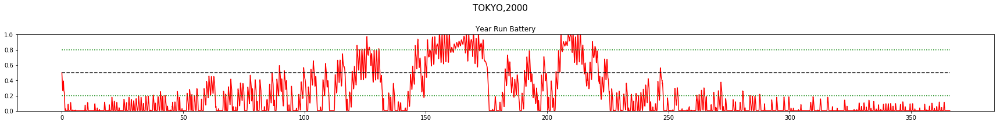

1 0.1
LOSS : 0.211
2 0.12439024390243902
LOSS : 0.120
3 0.14761904761904762
LOSS : 0.119
4 0.1697674418604651
LOSS : 0.108
5 0.19090909090909092
LOSS : 0.112
6 0.2111111111111111
LOSS : 0.118
7 0.23043478260869565
LOSS : 0.121
DAY: 7

CHECKING... 


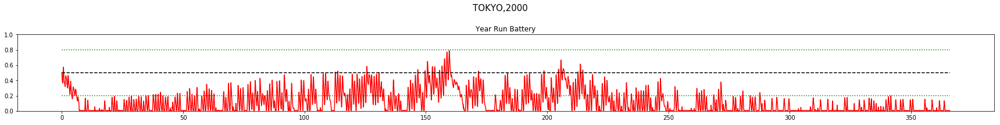

8 0.24893617021276596
LOSS : 0.134
9 0.26666666666666666
LOSS : 0.151
10 0.2836734693877551
LOSS : 0.177
11 0.30000000000000004
LOSS : 0.203
12 0.3156862745098039
LOSS : 0.233
13 0.3307692307692308
LOSS : 0.271
14 0.34528301886792456
LOSS : 0.302
DAY: 14

CHECKING... 


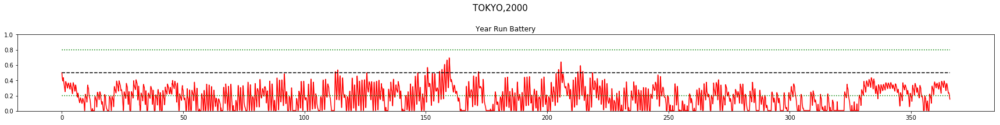

15 0.3592592592592593
LOSS : 0.327
16 0.3727272727272727
LOSS : 0.367
17 0.3857142857142857
LOSS : 0.410
18 0.39824561403508774
LOSS : 0.468
19 0.41034482758620694
LOSS : 0.531
20 0.42203389830508475
LOSS : 0.583
21 0.43333333333333335
LOSS : 0.664
DAY: 21

CHECKING... 


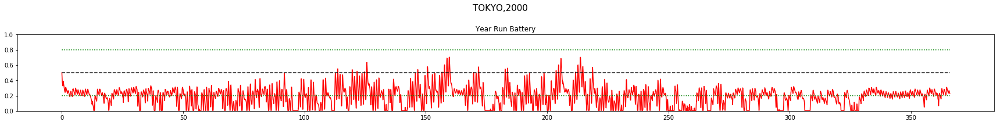

22 0.44426229508196724
LOSS : 0.748
23 0.45483870967741935
LOSS : 0.842
24 0.4650793650793651
LOSS : 0.951
25 0.475
LOSS : 1.047
26 0.48461538461538467
LOSS : 1.151
27 0.4939393939393939
LOSS : 1.267
28 0.5029850746268657
LOSS : 1.376
DAY: 28

CHECKING... 


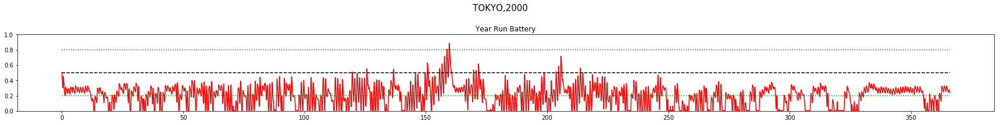

29 0.5117647058823529
LOSS : 1.492
30 0.5202898550724637
LOSS : 1.601
31 0.5285714285714286
LOSS : 1.784
32 0.5366197183098591
LOSS : 2.007
33 0.5444444444444444
LOSS : 2.203
34 0.552054794520548
LOSS : 2.370
35 0.5594594594594595
LOSS : 2.530
DAY: 35

CHECKING... 


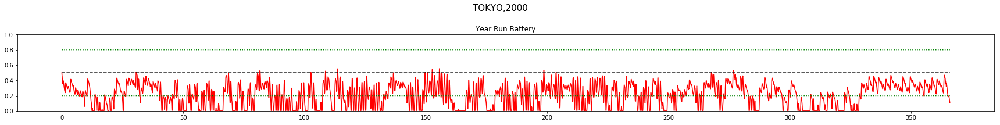

36 0.5666666666666667
LOSS : 2.636
37 0.5736842105263158
LOSS : 2.810
38 0.5805194805194805
LOSS : 2.908
39 0.5871794871794872
LOSS : 2.951
40 0.5936708860759494
LOSS : 3.114
41 0.6
LOSS : 3.353
42 0.6061728395061728
LOSS : 3.437
DAY: 42

CHECKING... 


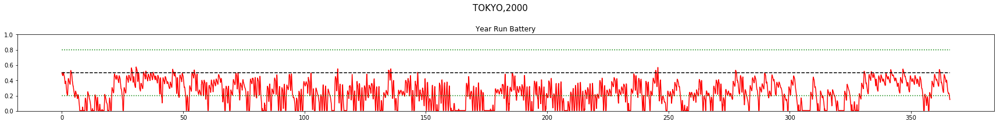

43 0.6121951219512195
LOSS : 3.518
44 0.6180722891566265
LOSS : 3.642
45 0.6238095238095238
LOSS : 3.570
46 0.6294117647058823
LOSS : 3.626
47 0.6348837209302325
LOSS : 3.732
48 0.6402298850574712
LOSS : 3.799
49 0.6454545454545454
LOSS : 3.836
DAY: 49

CHECKING... 


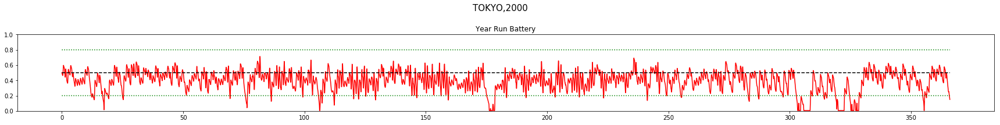

50 0.650561797752809
LOSS : 4.016
51 0.6555555555555556
LOSS : 4.219
52 0.6604395604395604
LOSS : 4.489
53 0.6652173913043478
LOSS : 5.127
54 0.6698924731182796
LOSS : 5.411
55 0.674468085106383
LOSS : 5.680
56 0.6789473684210526
LOSS : 6.089
DAY: 56

CHECKING... 


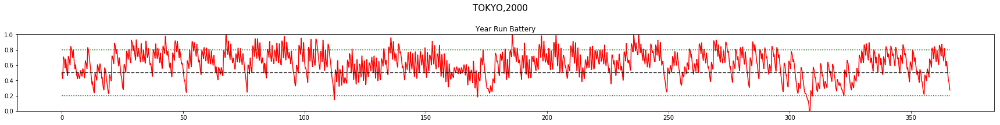

57 0.6833333333333333
LOSS : 6.508
58 0.6876288659793814
LOSS : 6.821
59 0.6918367346938775
LOSS : 7.247
60 0.6959595959595959
LOSS : 7.745
61 0.7
LOSS : 8.081
62 0.7039603960396039
LOSS : 8.906
63 0.7078431372549019
LOSS : 9.361
DAY: 63

CHECKING... 


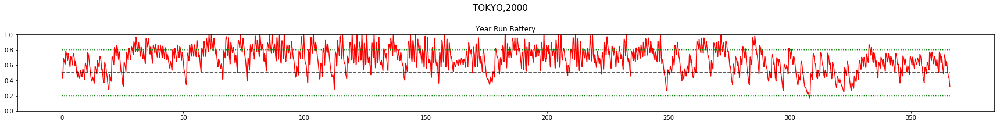

64 0.7116504854368931
LOSS : 9.874
65 0.7153846153846154
LOSS : 10.524
66 0.719047619047619
LOSS : 11.003
67 0.7226415094339622
LOSS : 11.714
68 0.7261682242990654
LOSS : 12.214
69 0.7296296296296296
LOSS : 12.701
70 0.7330275229357798
LOSS : 13.241
DAY: 70

CHECKING... 


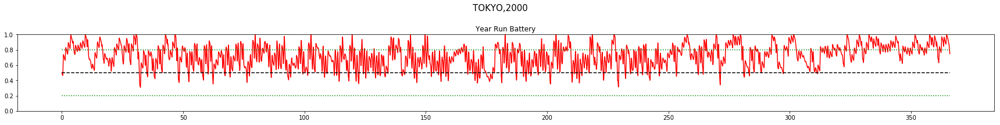

71 0.7363636363636363
LOSS : 13.489
72 0.7396396396396396
LOSS : 14.042
73 0.7428571428571429
LOSS : 14.058
74 0.7460176991150442
LOSS : 14.437
75 0.7491228070175439
LOSS : 14.831
76 0.7521739130434782
LOSS : 14.745
77 0.7551724137931034
LOSS : 14.644
DAY: 77

CHECKING... 


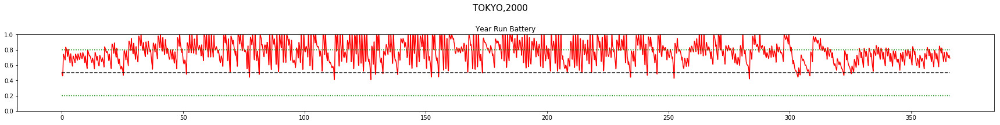

78 0.7581196581196581
LOSS : 14.567
79 0.7610169491525424
LOSS : 14.342
80 0.7638655462184873
LOSS : 14.327
81 0.7666666666666666
LOSS : 14.184
82 0.7694214876033058
LOSS : 14.184
83 0.7721311475409836
LOSS : 14.236
84 0.7747967479674797
LOSS : 14.053
DAY: 84

CHECKING... 


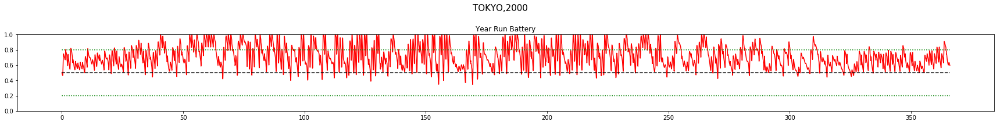

85 0.7774193548387096
LOSS : 14.193
86 0.78
LOSS : 13.919
87 0.7825396825396825
LOSS : 14.069
88 0.7850393700787401
LOSS : 13.828
89 0.7875
LOSS : 14.114
90 0.789922480620155
LOSS : 14.197
91 0.7923076923076923
LOSS : 14.308
DAY: 91

CHECKING... 


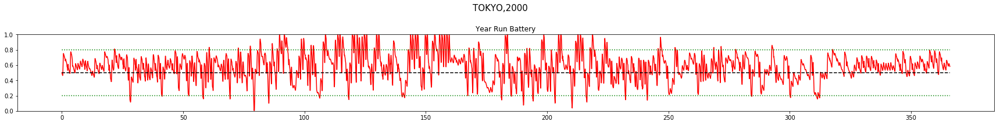

92 0.7946564885496183
LOSS : 14.392
93 0.796969696969697
LOSS : 14.588
94 0.7992481203007519
LOSS : 14.902
95 0.8014925373134328
LOSS : 14.575
96 0.8037037037037037
LOSS : 14.452
97 0.8058823529411765
LOSS : 14.554
98 0.808029197080292
LOSS : 14.545
DAY: 98

CHECKING... 


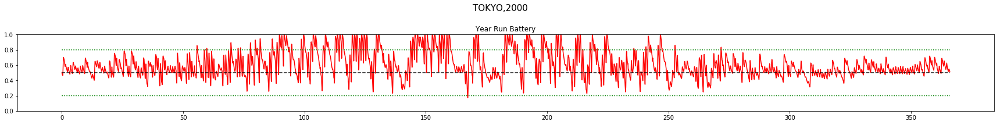

99 0.8101449275362319
LOSS : 14.384
100 0.8122302158273381
LOSS : 14.389
101 0.8142857142857143
LOSS : 14.115
102 0.8163120567375887
LOSS : 14.222
103 0.8183098591549296
LOSS : 13.847
104 0.8202797202797203
LOSS : 13.851
105 0.8222222222222222
LOSS : 13.756
DAY: 105

CHECKING... 


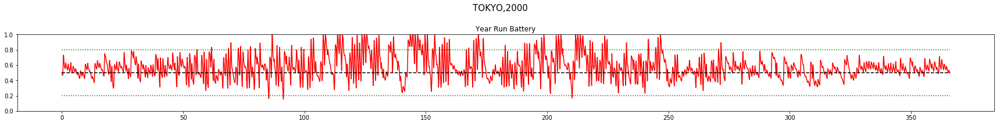

106 0.8241379310344827
LOSS : 14.605
107 0.826027397260274
LOSS : 14.889
108 0.827891156462585
LOSS : 14.996
109 0.8297297297297297
LOSS : 14.809
110 0.8315436241610739
LOSS : 14.667
111 0.8333333333333333
LOSS : 16.333
112 0.8350993377483443
LOSS : 16.875
DAY: 112

CHECKING... 


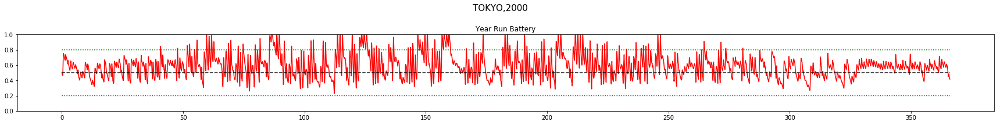

113 0.8368421052631578
LOSS : 16.400
114 0.838562091503268
LOSS : 16.594
115 0.8402597402597403
LOSS : 16.671
116 0.8419354838709677
LOSS : 16.323
117 0.8435897435897436
LOSS : 16.194
118 0.8452229299363057
LOSS : 16.767
119 0.8468354430379746
LOSS : 16.143
DAY: 119

CHECKING... 


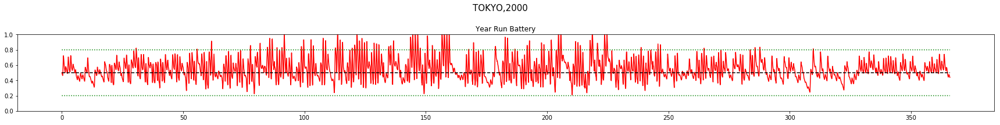

120 0.8484276729559748
LOSS : 16.180
121 0.85
LOSS : 16.475
122 0.8515527950310559
LOSS : 16.016
123 0.8530864197530864
LOSS : 15.698
124 0.854601226993865
LOSS : 15.763
125 0.8560975609756097
LOSS : 15.950
126 0.8575757575757575
DAY: 126

CHECKING... 


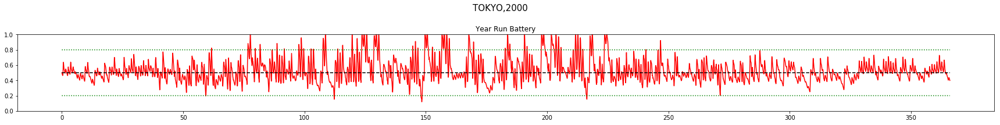

127 0.8590361445783132
LOSS : 15.188
128 0.8604790419161676
LOSS : 15.360
129 0.8619047619047618
LOSS : 14.948
130 0.8633136094674556
LOSS : 14.996
131 0.8647058823529411
LOSS : 14.862
132 0.8660818713450292
LOSS : 14.794
133 0.8674418604651163
LOSS : 14.514
DAY: 133

CHECKING... 


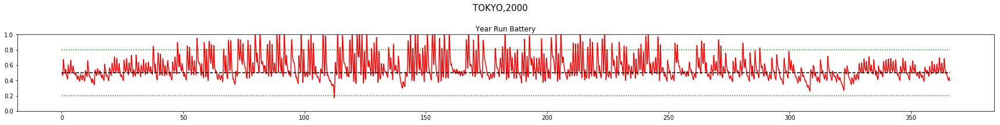

134 0.86878612716763
LOSS : 14.297
135 0.8701149425287356
LOSS : 14.411
136 0.8714285714285714
LOSS : 14.174
137 0.8727272727272727
LOSS : 14.294
138 0.8740112994350282
LOSS : 14.384
139 0.8752808988764045
LOSS : 14.137
140 0.876536312849162
LOSS : 13.803
DAY: 140

CHECKING... 


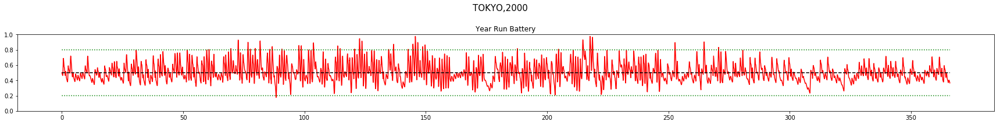

141 0.8777777777777778
LOSS : 14.067
142 0.8790055248618784
LOSS : 14.039
143 0.8802197802197802
LOSS : 14.262
144 0.8814207650273224
LOSS : 13.859
145 0.8826086956521739
LOSS : 13.927
146 0.8837837837837837
LOSS : 13.552
147 0.8849462365591397
LOSS : 13.482
DAY: 147

CHECKING... 


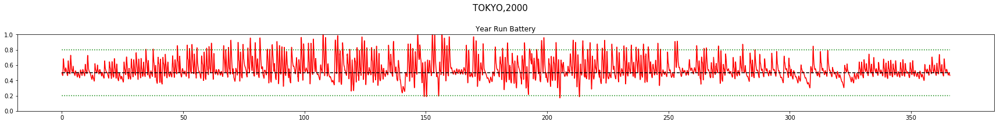

148 0.886096256684492
LOSS : 13.059
149 0.8872340425531915
LOSS : 13.263
150 0.8883597883597883
LOSS : 13.562
151 0.8894736842105263
LOSS : 12.936
152 0.8905759162303665
LOSS : 12.546
153 0.8916666666666666
LOSS : 12.576
154 0.8927461139896373
LOSS : 12.385
DAY: 154

CHECKING... 


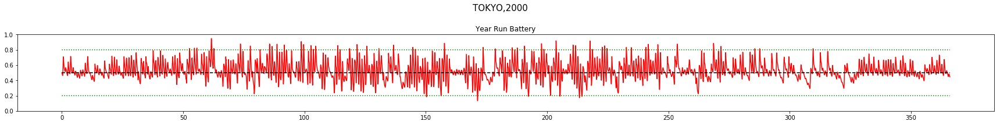

155 0.8938144329896907
LOSS : 11.955
156 0.8948717948717948
LOSS : 12.339
157 0.8959183673469387
LOSS : 11.747
158 0.8969543147208121
LOSS : 12.178
159 0.897979797979798
LOSS : 12.050
160 0.8989949748743719
LOSS : 12.214
161 0.9
LOSS : 11.682
DAY: 161

CHECKING... 


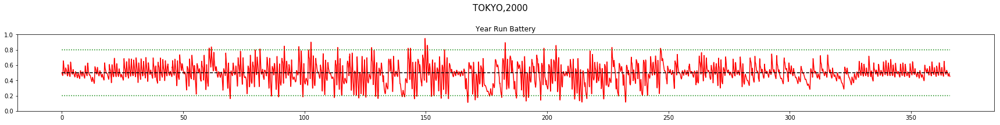

162 0.9009950248756219
LOSS : 11.738
163 0.901980198019802
LOSS : 11.392
164 0.9029556650246305
LOSS : 11.462
165 0.903921568627451
LOSS : 11.722
166 0.9048780487804878
LOSS : 11.639
167 0.9058252427184466
LOSS : 11.698
168 0.9067632850241546
LOSS : 11.832
DAY: 168

CHECKING... 


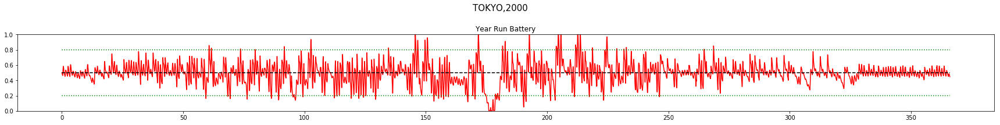

169 0.9076923076923077
LOSS : 11.697
170 0.9086124401913875
LOSS : 11.347
171 0.9095238095238095
LOSS : 11.352
172 0.9104265402843602
LOSS : 11.471
173 0.9113207547169812
LOSS : 10.918
174 0.912206572769953
LOSS : 10.995
175 0.9130841121495327
LOSS : 10.987
DAY: 175

CHECKING... 


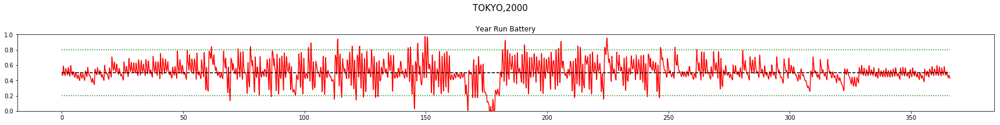

176 0.913953488372093
LOSS : 10.753
177 0.9148148148148147
LOSS : 11.164
178 0.915668202764977
LOSS : 11.105
179 0.9165137614678899
LOSS : 11.009
180 0.917351598173516
LOSS : 11.112
181 0.9181818181818182
LOSS : 10.894


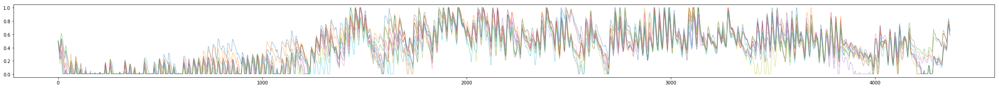

In [25]:
from figplot import figplot

ANNUAL_MEMORY = []
TOTAL_MEMORY = []

yr = 2000
dummy1 = CAPM(LOCATION, yr)
dummy1.eno = ENO(LOCATION, yr)
dummy1.HMAX = dummy1.eno.SMAX
dummy1.reset()
capm_list = [dummy1]*NO_OF_NODES

sc_EPSILON = 0.1
for iteration in range(1):
    print(iteration, sc_EPSILON)
    ANNUAL_MEMORY.clear()

    for cpm in capm_list:
        cpm.eno.day = 0
    print(capm_list[0].year)
    
    for day in range(26*7):
        if iteration <= 0:
            print(day, sc_EPSILON)
            A = 40
            sc_EPSILON = np.clip((0.1 + day/(day+A)),0.1,0.99)
        
        day_list = [day]*NO_OF_NODES
        sc_EPSILON_list = [sc_EPSILON]*NO_OF_NODES
        param_list = [MODEL_FILENAME]*NO_OF_NODES
        arglist = [arg for arg in zip(range(NO_OF_NODES), day_list, sc_EPSILON_list, param_list, capm_list)]
        result = pool.starmap(T_ENO, arglist)

        node_experience  = np.array([item[0] for item in result])
        capm_list = [item[1] for item in result]

        ANNUAL_MEMORY.append(node_experience)
        TOTAL_MEMORY.append(node_experience)
        all_exp = np.array([item for each_node_exp in node_experience 
                                    for episode_exp in each_node_exp 
                                        for item in episode_exp]).reshape(-1,10)

        dqn.memory = np.insert(dqn.memory, 0, all_exp , 0)
        dqn.memory = dqn.memory[:MEMORY_CAPACITY,:]
        dqn.memory_counter += all_exp.shape[0]


        if dqn.memory_counter > 24*7:#MEMORY_CAPACITY:
            for nn_iter in range(NN_ITERATIONS):
                dqn.learn()
            # SAVE MODEL
            torch.save(dqn.eval_net.state_dict(), MODEL_FILENAME)
            
        if day%7==0:
            print("DAY:", day)
            print("\nCHECKING... ")
            # CHECKING NN MODEL
            #########################################################################################################################
            LOCATION = 'tokyo'#random.choice(['tokyo','aomori','fukuoka'])
            YEAR = 2000#random.choice(np.arange(2000,2010))

            capm = CAPM(LOCATION,YEAR,shuffle=False, trainmode=False) #instantiate the CAPM class
            capm.eno = ENO(LOCATION,YEAR, shuffle=False, day_balance=False) #instantiate the environment inside the CAPM class
            capm.HMAX = capm.eno.SMAX #maximum power output of solar cell is set in CAPM object using the value in ENO object

            s, r, day_end, year_end = capm.reset()
            yr_test_record = np.empty(4)

            while True:
                a = dqn.choose_greedy_action(stdize(s))
                #state = [batt, enp, henergy, fcast]
                yr_test_record = np.vstack((yr_test_record, [s[0],s[2],r, a])) #record battery, henergy, reward and action

                # take action
                s_, r, day_end, year_end = capm.step(a)

                if year_end:
                    break

                s = s_

            yr_test_record = np.delete(yr_test_record, 0, 0) #remove the first row which is garbage
            yr_test_reward_rec = yr_test_record[:,2]
            yr_test_reward_rec = yr_test_reward_rec[::24]

            title = LOCATION.upper() + ',' + str(YEAR)
            NO_OF_DAYS = capm.eno.NO_OF_DAYS

            fig = plt.figure(figsize=(24,3))
            fig.suptitle(title, fontsize=15)
            #Plot the reward and battery for the entire year run
            ax2 = fig.add_subplot(111)
            ax2.plot(yr_test_record[:,0],'r')
            ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BOPT/capm.BMAX, 'k--')
            ax2.plot(np.ones_like(yr_test_record[:,0])*(capm.BOPT+capm.ENP_MARGIN) /capm.BMAX, 'g:')
            ax2.plot(np.ones_like(yr_test_record[:,0])*(capm.BOPT-capm.ENP_MARGIN)/capm.BMAX, 'g:')
            ax2.set_title("\n\nYear Run Battery")
            ax2.set_ylim([0,1])
            plt.sca(ax2)
            plt.xticks(np.arange(0, NO_OF_DAYS*24, 50*24),np.arange(0,NO_OF_DAYS,50))
            fig.tight_layout()
            plt.show()
            ##########################################################################################################################

    AN_NUAL_MEMORY = np.array(ANNUAL_MEMORY)
    MEM = np.einsum('dnes->ndes',AN_NUAL_MEMORY)
    #single file all data
    STATES = MEM[:,:,:,0:N_STATES].reshape(-1,4)
    ACTIONS = MEM[:,:,:,N_STATES:N_STATES+1].reshape(-1,1)
    REWARDS = MEM[:,:,:,N_STATES+1:N_STATES+2].reshape(-1,1)
    #Destandardize state values from memory
    DSTD_STATES = batch_destdize(STATES)
    #NODE_MEMS contains list of (s,a,r) for all hours of all days for each node
    NODE_MEMS = np.column_stack((DSTD_STATES,ACTIONS,REWARDS))
    NODE_MEMS = NODE_MEMS.reshape(NO_OF_NODES,-1,6)

    plt.figure(figsize=(39,3))
    for i in range(NO_OF_NODES):
        plt.plot(NODE_MEMS[i,:,0], alpha=0.5, linewidth=1.0)
    plt.show()


pool.close()
pool.join()
    
    

In [26]:
# TOTAL_MEMORY = np.array(TOTAL_MEMORY)

# MEM = np.einsum('dnes->ndes',TOTAL_MEMORY)

# #single file all data
# STATES = MEM[:,:,:,0:N_STATES].reshape(-1,4)
# ACTIONS = MEM[:,:,:,N_STATES:N_STATES+1].reshape(-1,1)
# REWARDS = MEM[:,:,:,N_STATES+1:N_STATES+2].reshape(-1,1)

In [27]:
# #Destandardize state values from memory
# DSTD_STATES = batch_destdize(STATES)

In [28]:
# #NODE_MEMS contains list of (s,a,r) for all hours of all days for each node
# NODE_MEMS = np.column_stack((DSTD_STATES,ACTIONS,REWARDS))
# NODE_MEMS = NODE_MEMS.reshape(NO_OF_NODES,-1,6)
# # np.save('DENO',NODE_MEMS)


In [29]:
# plt.figure(figsize=(24,3))
# plt.plot(node_0[:,0],'r')
# # plt.plot(z[:,1])
# plt.plot(node_0[:,2],'c',alpha=0.4)
# # plt.plot(node_0[:,3],'b')
# plt.plot(node_0[:,4]/9,'b')
# # plt.plot(node_0[:,5],'k--')
# plt.minorticks_on()

# plt.grid(which='both',axis='x')

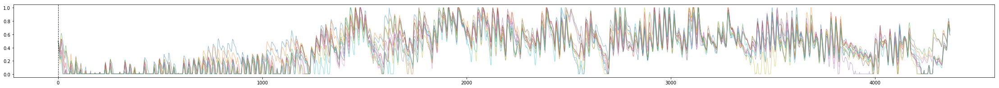

In [30]:
plt.figure(figsize=(39,3))
for i in range(NO_OF_NODES):
    plt.plot(NODE_MEMS[i,:,0], alpha=0.5, linewidth=1.0)
for i in range(iteration+1):
    plt.axvline(x=i*24*365,color='k',linewidth=1.0,linestyle='--',alpha=0.8)



In [31]:
batt = NODE_MEMS[:,:,0]

In [32]:
downtime_occur = (batt < 0.006).astype(int)
overflow_occur = (batt == 1).astype(int)

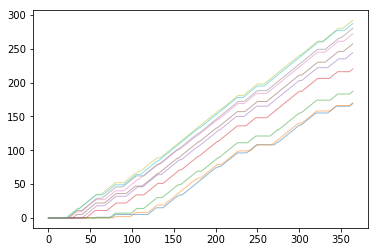

In [33]:
#DOWNTIME PER NODE WITH TIME
for i in range(NO_OF_NODES):
    plt.plot(downtime_occur[i,0:365].cumsum(), alpha=0.5, linewidth=1.0)

# for i in range(iteration+1):
#     plt.axvline(x=i*24*365,color='k',linewidth=1.0,linestyle='--',alpha=0.1)

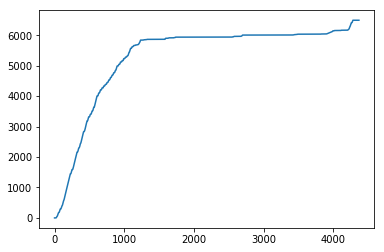

In [34]:
# OVERALL DOWNTIME OF SYSTEM

total_downtime = downtime_occur.sum(axis=0)
plt.plot(total_downtime.cumsum())

# for i in range(iteration+1):
#     plt.axvline(x=i*24*365,color='k',linewidth=1.0,linestyle='--',alpha=0.1)

<BarContainer object of 10 artists>

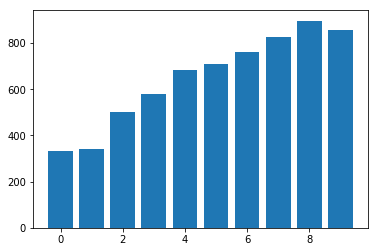

In [35]:
# TOTAL DOWNTIME PER NODE

total_downtime = downtime_occur.sum(axis = 1)
plt.bar(range(NO_OF_NODES),height = total_downtime)

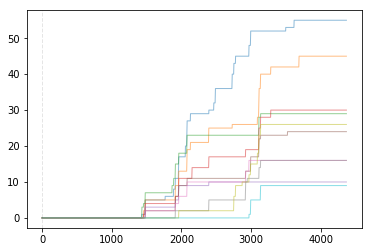

In [36]:
#OVERFLOW PER NODE WITH TIME

for i in range(NO_OF_NODES):
    plt.plot(overflow_occur[i,:].cumsum(), alpha=0.5, linewidth=1.0)
    
for i in range(iteration+1):
    plt.axvline(x=i*24*365,color='k',linewidth=1.0,linestyle='--',alpha=0.1)

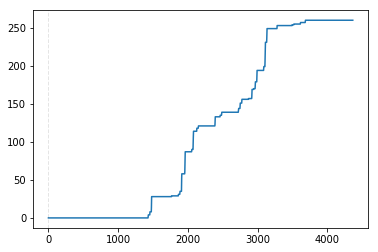

In [37]:
# OVERALL OVERFLOW OF SYSTEM

total_overflow = overflow_occur.sum(axis=0)
plt.plot(total_overflow.cumsum())

for i in range(iteration+1):
    plt.axvline(x=i*24*365,color='k',linewidth=1.0,linestyle='--',alpha=0.1)

<BarContainer object of 10 artists>

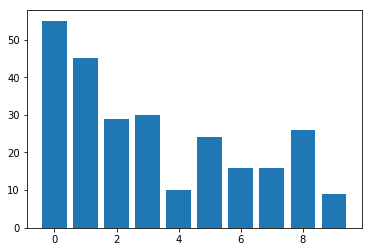

In [38]:
# TOTAL OVERFLOW  PER NODE

total_overflow = overflow_occur.sum(axis = 1)
plt.bar(range(NO_OF_NODES),height = total_overflow)

In [39]:
S_FILENAME = MODEL_FILENAME
print("Loading MODEL from FILE: ", S_FILENAME)
dqn = DQN()
dqn.eval_net.load_state_dict(torch.load(S_FILENAME))
dqn.eval_net.eval()
print("DEVICE: ", dqn.device)

Loading MODEL from FILE:  ./models/DENOSTI6WR1Z__17_21_00__161.pt
DEVICE:  cpu


***MEASURING PERFORMANCE OF THE MODEL***


************************************
Day Violations           =     63
Battery Limit Violations =   1259
Battery FULL Violations  =      7
Battery EMPTY Violations =   1252


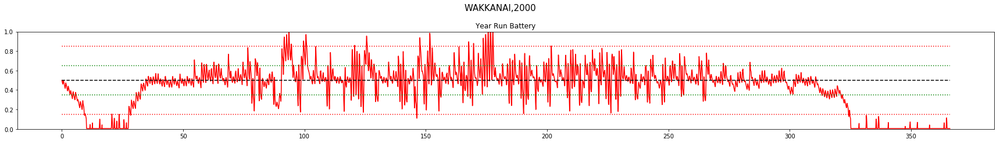



************************************
Day Violations           =     81
Battery Limit Violations =   1553
Battery FULL Violations  =     12
Battery EMPTY Violations =   1541


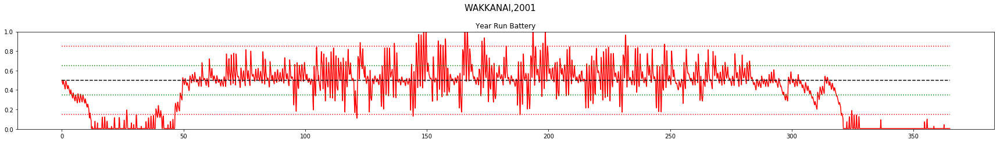



************************************
Day Violations           =     71
Battery Limit Violations =   1399
Battery FULL Violations  =      5
Battery EMPTY Violations =   1394


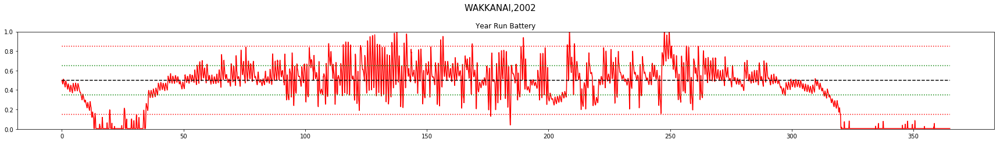



************************************
Day Violations           =     68
Battery Limit Violations =   1261
Battery FULL Violations  =     33
Battery EMPTY Violations =   1228


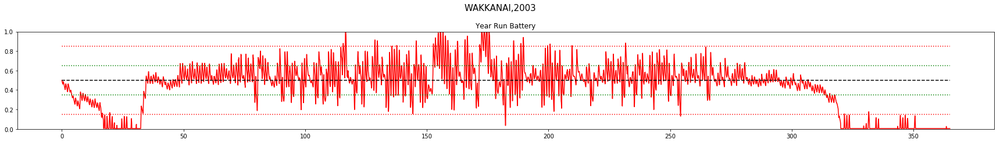



************************************
Day Violations           =     81
Battery Limit Violations =   1404
Battery FULL Violations  =     35
Battery EMPTY Violations =   1369


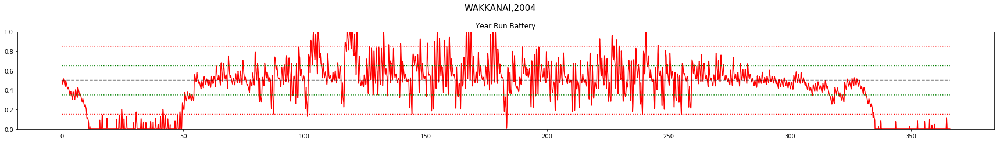



************************************
Day Violations           =     64
Battery Limit Violations =   1251
Battery FULL Violations  =      4
Battery EMPTY Violations =   1247


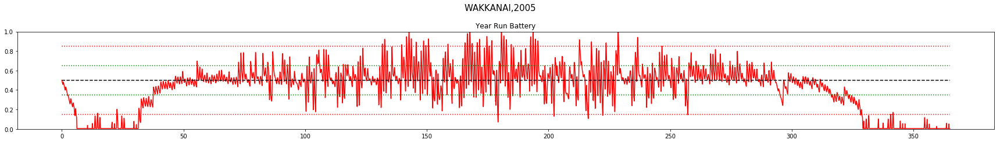



************************************
Day Violations           =     67
Battery Limit Violations =   1279
Battery FULL Violations  =     18
Battery EMPTY Violations =   1261


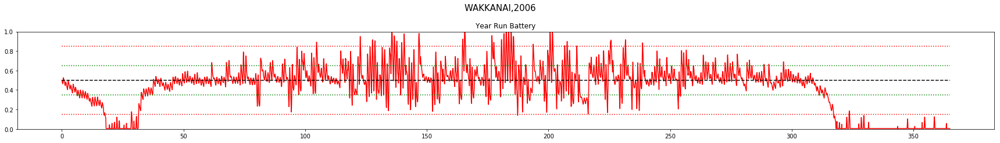



************************************
Day Violations           =     63
Battery Limit Violations =   1151
Battery FULL Violations  =     11
Battery EMPTY Violations =   1140


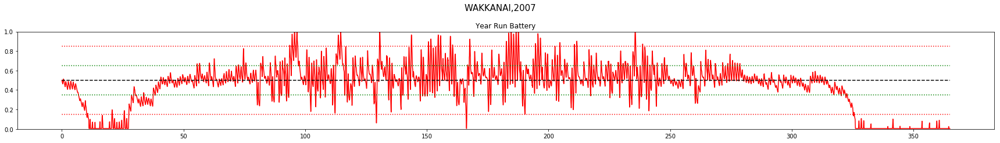



************************************
Day Violations           =     74
Battery Limit Violations =   1343
Battery FULL Violations  =     15
Battery EMPTY Violations =   1328


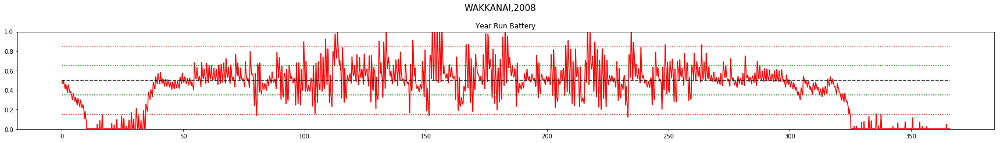



************************************
Day Violations           =     89
Battery Limit Violations =   1655
Battery FULL Violations  =     13
Battery EMPTY Violations =   1642


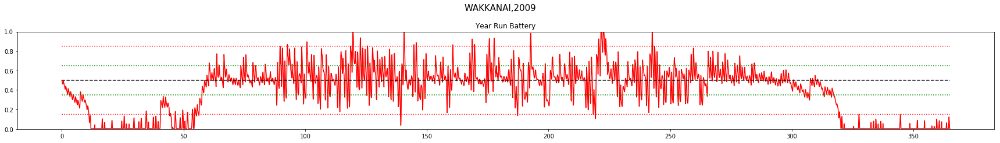



************************************
Day Violations           =     66
Battery Limit Violations =   1220
Battery FULL Violations  =     16
Battery EMPTY Violations =   1204


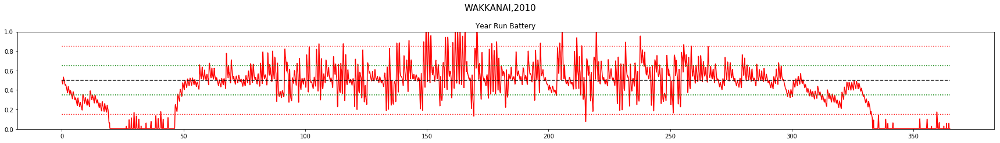



************************************
Day Violations           =     63
Battery Limit Violations =   1263
Battery FULL Violations  =      4
Battery EMPTY Violations =   1259


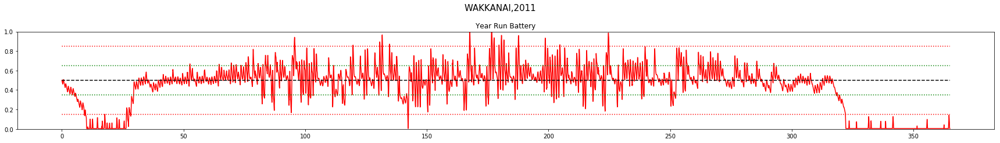



************************************
Day Violations           =     87
Battery Limit Violations =   1749
Battery FULL Violations  =      4
Battery EMPTY Violations =   1745


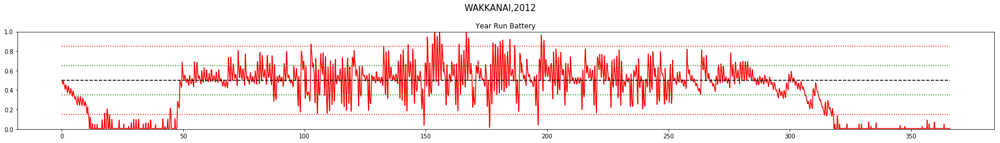



************************************
Day Violations           =     79
Battery Limit Violations =   1518
Battery FULL Violations  =      9
Battery EMPTY Violations =   1509


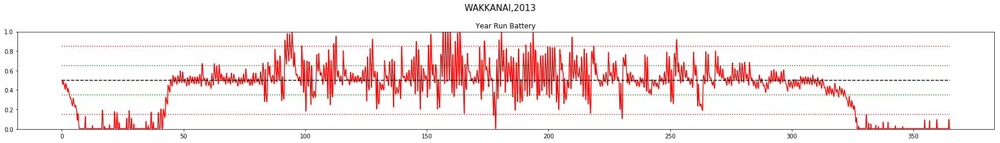



************************************
Day Violations           =     77
Battery Limit Violations =   1363
Battery FULL Violations  =     17
Battery EMPTY Violations =   1346


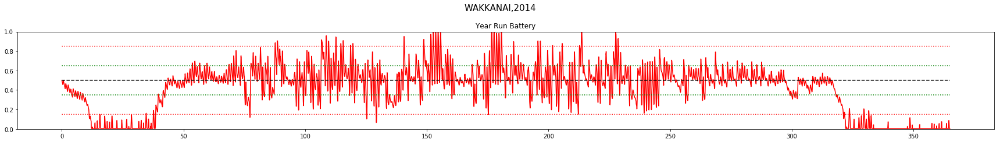



************************************
Day Violations           =     63
Battery Limit Violations =   1197
Battery FULL Violations  =      5
Battery EMPTY Violations =   1192


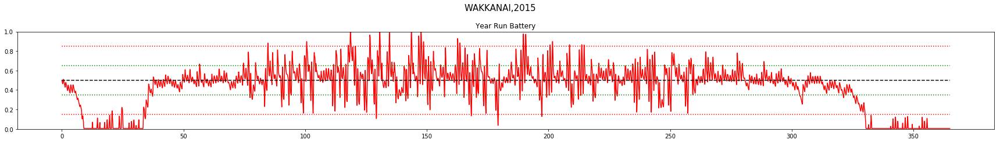



************************************
Day Violations           =    103
Battery Limit Violations =   1958
Battery FULL Violations  =     18
Battery EMPTY Violations =   1940


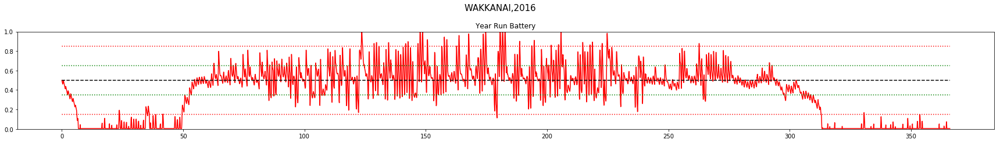



************************************
Day Violations           =     68
Battery Limit Violations =   1310
Battery FULL Violations  =     14
Battery EMPTY Violations =   1296


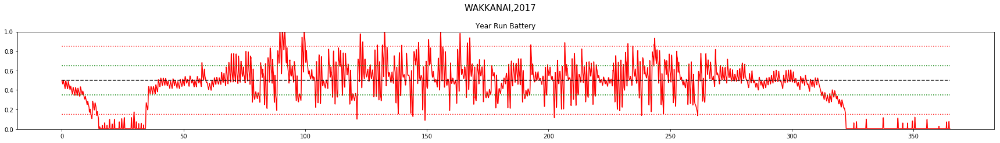



************************************
Day Violations           =     73
Battery Limit Violations =   1288
Battery FULL Violations  =     40
Battery EMPTY Violations =   1248


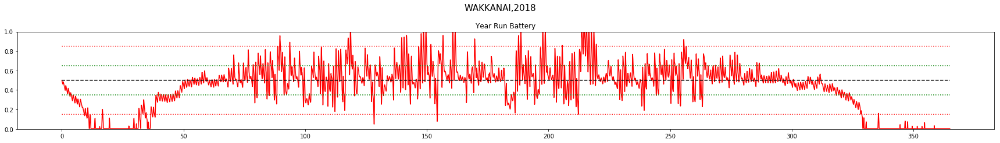



WAKKANAI
YEAR	AVG_RWD		VIOLATIONS	EMPTY	FULL
			DAY	BATT
2000	 0.63		63	 1259	1252	7
2001	 0.55		81	 1553	1541	12
2002	 0.6		71	 1399	1394	5
2003	 0.63		68	 1261	1228	33
2004	 0.57		81	 1404	1369	35
2005	 0.63		64	 1251	1247	4
2006	 0.63		67	 1279	1261	18
2007	 0.65		63	 1151	1140	11
2008	 0.61		74	 1343	1328	15
2009	 0.51		89	 1655	1642	13
2010	 0.63		66	 1220	1204	16
2011	 0.65		63	 1263	1259	4
2012	 0.52		87	 1749	1745	4
2013	 0.56		79	 1518	1509	9
2014	 0.59		77	 1363	1346	17
2015	 0.65		63	 1197	1192	5
2016	 0.46		103	 1958	1940	18
2017	 0.62		68	 1310	1296	14
2018	 0.6		73	 1288	1248	40

TOTAL Day  Violations:   1400.0
TOTAL Batt  Violations:  26421.0
TOTAL EMPTY Violations:  26141.0
TOTAL FULL  Violations:  280.0
************************************


************************************
Day Violations           =     34
Battery Limit Violations =    539
Battery FULL Violations  =      9
Battery EMPTY Violations =    530


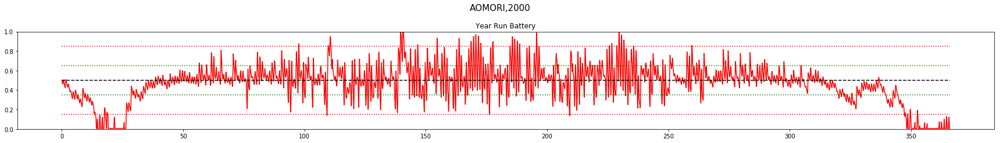



************************************
Day Violations           =     27
Battery Limit Violations =    521
Battery FULL Violations  =      6
Battery EMPTY Violations =    515


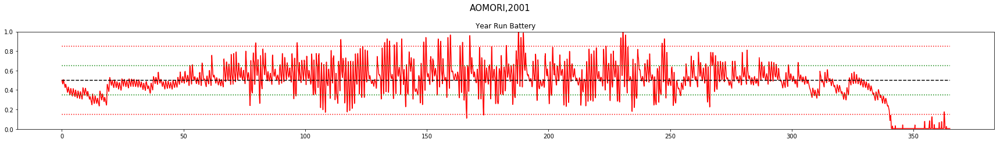



************************************
Day Violations           =     26
Battery Limit Violations =    438
Battery FULL Violations  =      1
Battery EMPTY Violations =    437


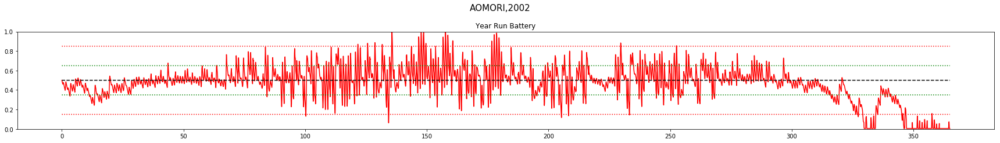



************************************
Day Violations           =     27
Battery Limit Violations =    461
Battery FULL Violations  =     10
Battery EMPTY Violations =    451


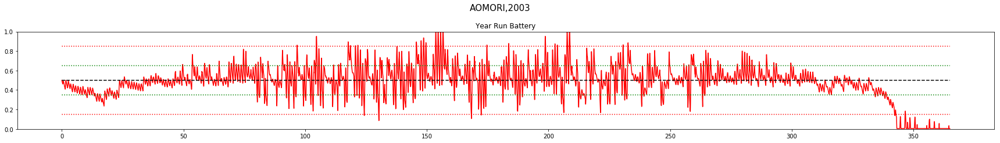



************************************
Day Violations           =     35
Battery Limit Violations =    508
Battery FULL Violations  =     23
Battery EMPTY Violations =    485


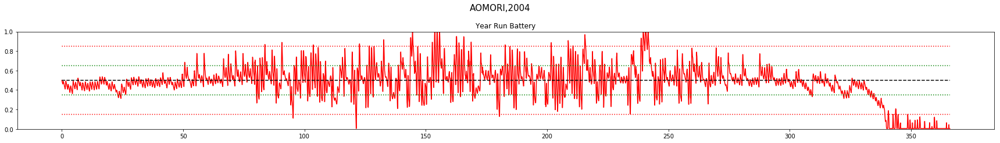



************************************
Day Violations           =     18
Battery Limit Violations =    220
Battery FULL Violations  =      1
Battery EMPTY Violations =    219


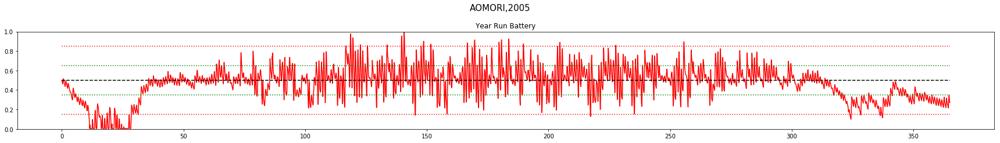



************************************
Day Violations           =     28
Battery Limit Violations =    530
Battery FULL Violations  =      2
Battery EMPTY Violations =    528


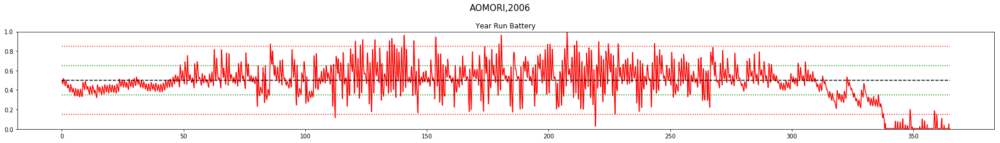



************************************
Day Violations           =     24
Battery Limit Violations =    317
Battery FULL Violations  =     17
Battery EMPTY Violations =    300


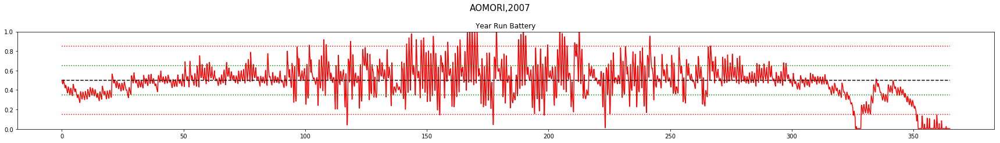



************************************
Day Violations           =     22
Battery Limit Violations =    341
Battery FULL Violations  =      8
Battery EMPTY Violations =    333


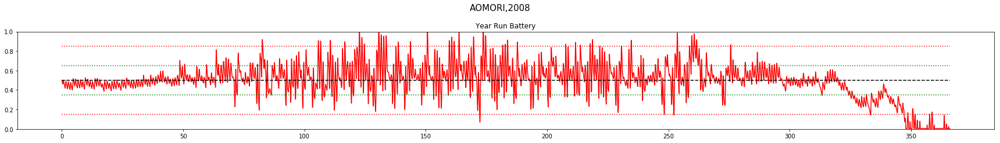



************************************
Day Violations           =     20
Battery Limit Violations =    343
Battery FULL Violations  =      6
Battery EMPTY Violations =    337


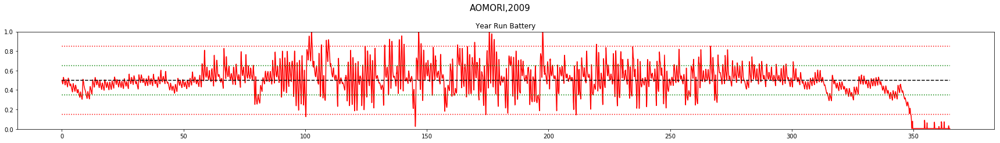



************************************
Day Violations           =     31
Battery Limit Violations =    486
Battery FULL Violations  =     10
Battery EMPTY Violations =    476


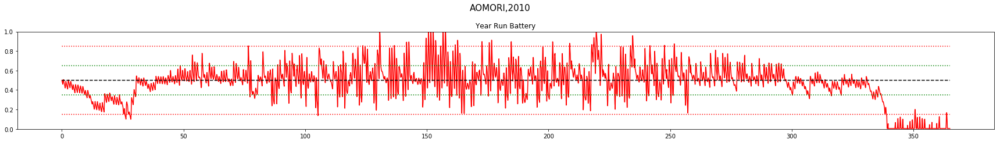



************************************
Day Violations           =     34
Battery Limit Violations =    646
Battery FULL Violations  =      9
Battery EMPTY Violations =    637


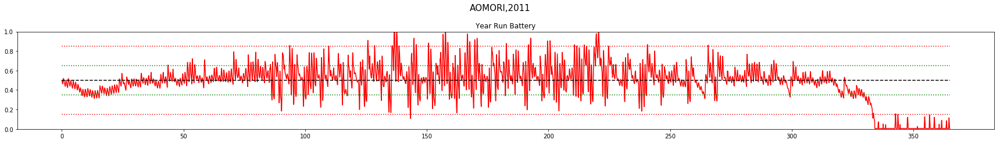



************************************
Day Violations           =     51
Battery Limit Violations =    761
Battery FULL Violations  =     30
Battery EMPTY Violations =    731


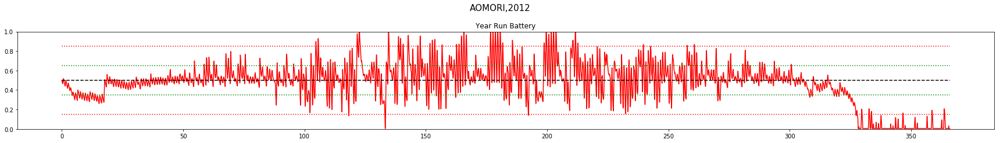



************************************
Day Violations           =     27
Battery Limit Violations =    378
Battery FULL Violations  =     12
Battery EMPTY Violations =    366


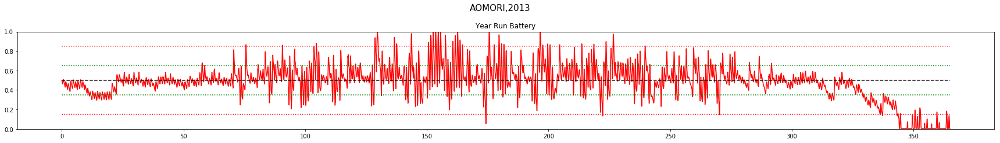



************************************
Day Violations           =     28
Battery Limit Violations =    505
Battery FULL Violations  =      6
Battery EMPTY Violations =    499


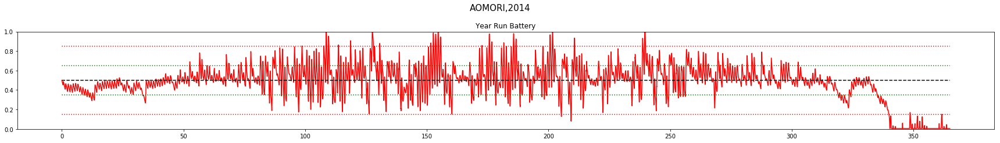



************************************
Day Violations           =     39
Battery Limit Violations =    587
Battery FULL Violations  =     35
Battery EMPTY Violations =    552


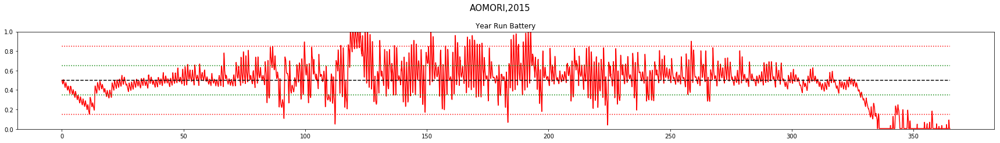



************************************
Day Violations           =     21
Battery Limit Violations =    302
Battery FULL Violations  =      8
Battery EMPTY Violations =    294


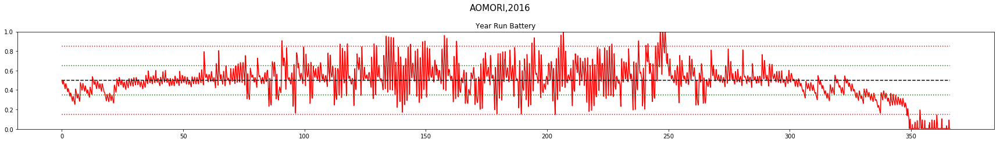



************************************
Day Violations           =     36
Battery Limit Violations =    646
Battery FULL Violations  =      1
Battery EMPTY Violations =    645


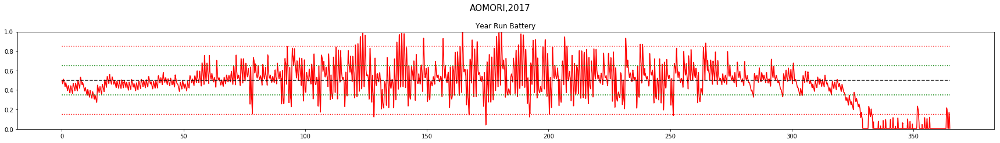



************************************
Day Violations           =     20
Battery Limit Violations =    308
Battery FULL Violations  =      7
Battery EMPTY Violations =    301


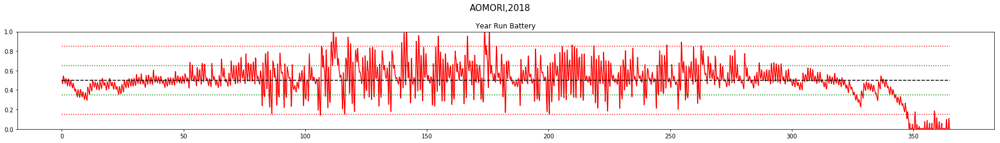



AOMORI
YEAR	AVG_RWD		VIOLATIONS	EMPTY	FULL
			DAY	BATT
2000	 0.8		34	 539	530	9
2001	 0.86		27	 521	515	6
2002	 0.84		26	 438	437	1
2003	 0.86		27	 461	451	10
2004	 0.83		35	 508	485	23
2005	 0.84		18	 220	219	1
2006	 0.84		28	 530	528	2
2007	 0.87		24	 317	300	17
2008	 0.85		22	 341	333	8
2009	 0.89		20	 343	337	6
2010	 0.81		31	 486	476	10
2011	 0.82		34	 646	637	9
2012	 0.76		51	 761	731	30
2013	 0.85		27	 378	366	12
2014	 0.84		28	 505	499	6
2015	 0.78		39	 587	552	35
2016	 0.88		21	 302	294	8
2017	 0.79		36	 646	645	1
2018	 0.88		20	 308	301	7

TOTAL Day  Violations:   548.0
TOTAL Batt  Violations:  8837.0
TOTAL EMPTY Violations:  8636.0
TOTAL FULL  Violations:  201.0
************************************


************************************
Day Violations           =      5
Battery Limit Violations =     43
Battery FULL Violations  =      5
Battery EMPTY Violations =     38


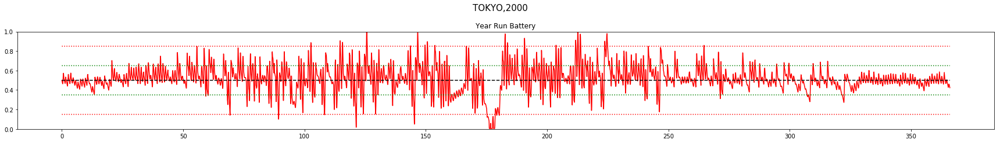



************************************
Day Violations           =      1
Battery Limit Violations =      2
Battery FULL Violations  =      2
Battery EMPTY Violations =      0


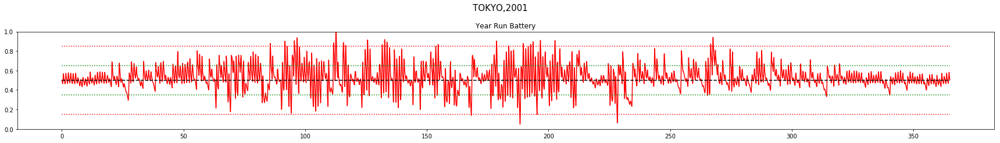



************************************
Day Violations           =      4
Battery Limit Violations =     16
Battery FULL Violations  =     16
Battery EMPTY Violations =      0


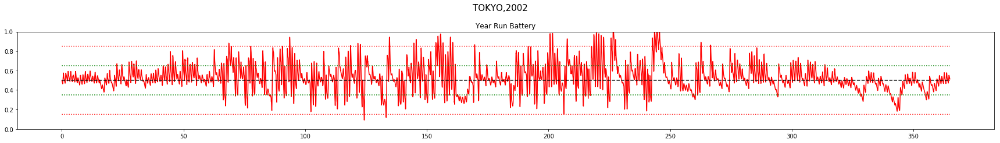



************************************
Day Violations           =      2
Battery Limit Violations =      4
Battery FULL Violations  =      4
Battery EMPTY Violations =      0


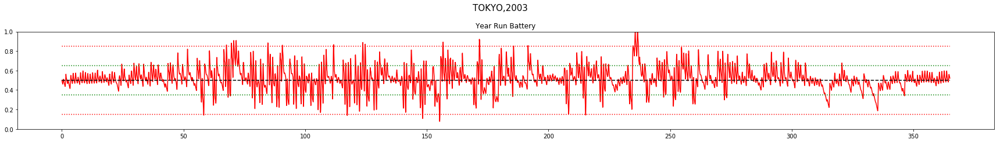



************************************
Day Violations           =     10
Battery Limit Violations =     31
Battery FULL Violations  =     31
Battery EMPTY Violations =      0


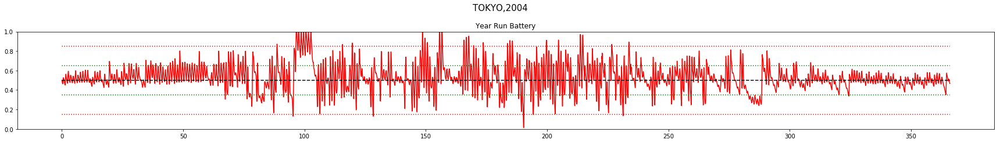



************************************
Day Violations           =      7
Battery Limit Violations =     24
Battery FULL Violations  =     24
Battery EMPTY Violations =      0


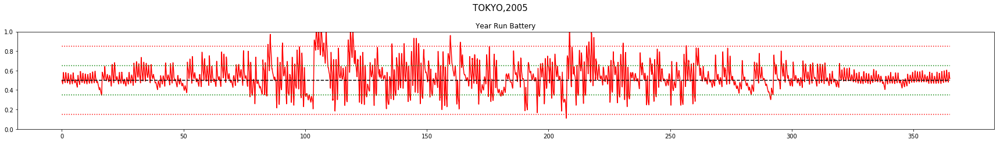



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


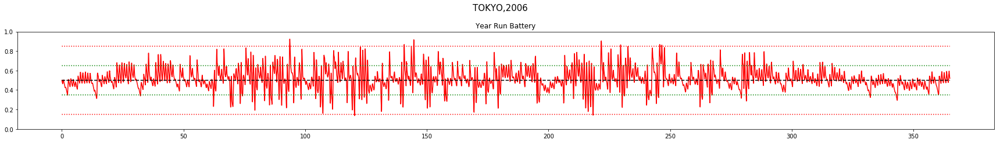



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


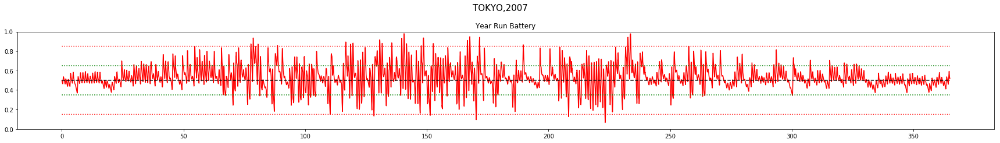



************************************
Day Violations           =      1
Battery Limit Violations =      3
Battery FULL Violations  =      3
Battery EMPTY Violations =      0


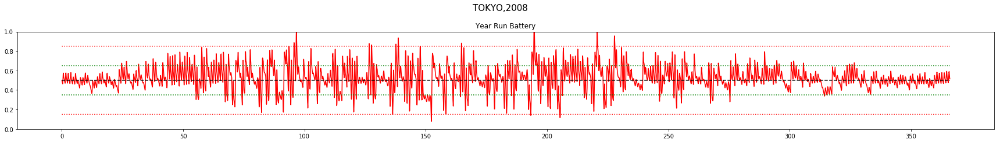



************************************
Day Violations           =      2
Battery Limit Violations =      4
Battery FULL Violations  =      4
Battery EMPTY Violations =      0


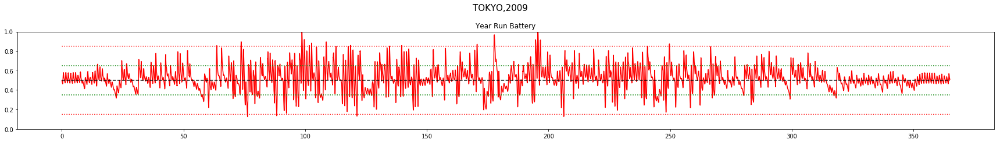



************************************
Day Violations           =     12
Battery Limit Violations =     28
Battery FULL Violations  =     25
Battery EMPTY Violations =      3


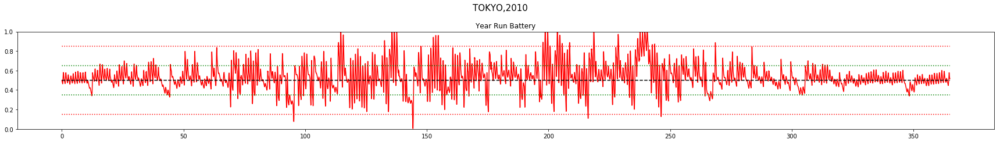



************************************
Day Violations           =      7
Battery Limit Violations =     19
Battery FULL Violations  =     19
Battery EMPTY Violations =      0


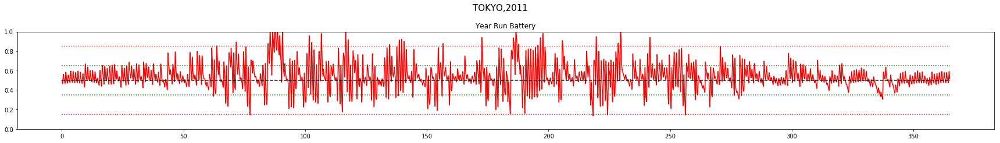



************************************
Day Violations           =      7
Battery Limit Violations =     19
Battery FULL Violations  =     17
Battery EMPTY Violations =      2


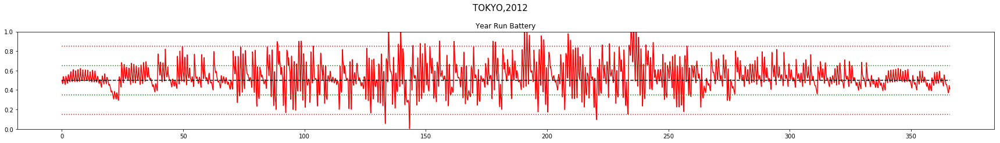



************************************
Day Violations           =     19
Battery Limit Violations =     60
Battery FULL Violations  =     59
Battery EMPTY Violations =      1


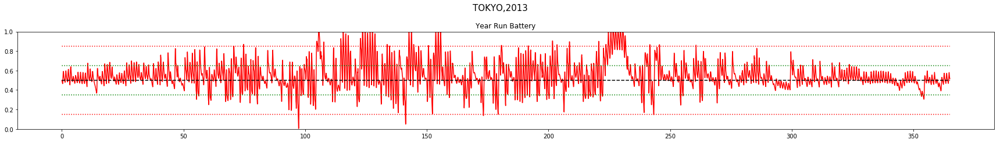



************************************
Day Violations           =     10
Battery Limit Violations =     34
Battery FULL Violations  =     34
Battery EMPTY Violations =      0


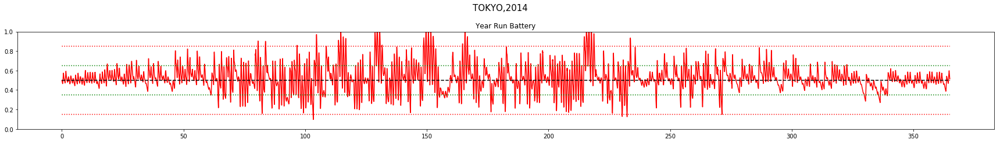



************************************
Day Violations           =      4
Battery Limit Violations =      9
Battery FULL Violations  =      7
Battery EMPTY Violations =      2


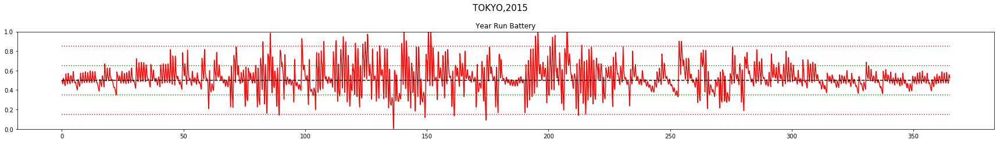



************************************
Day Violations           =      1
Battery Limit Violations =      3
Battery FULL Violations  =      3
Battery EMPTY Violations =      0


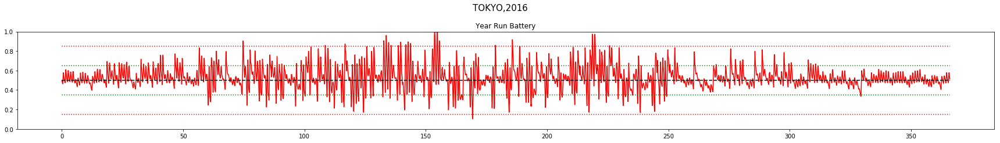



************************************
Day Violations           =      4
Battery Limit Violations =      9
Battery FULL Violations  =      9
Battery EMPTY Violations =      0


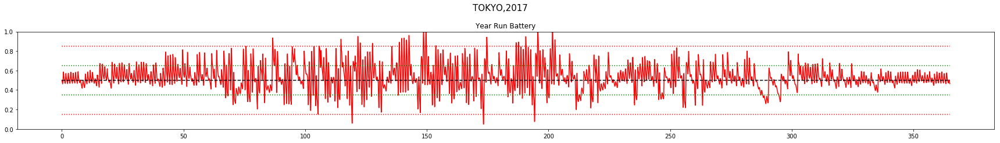



************************************
Day Violations           =     14
Battery Limit Violations =     33
Battery FULL Violations  =     33
Battery EMPTY Violations =      0


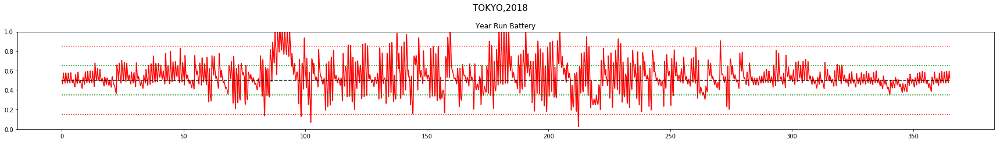



TOKYO
YEAR	AVG_RWD		VIOLATIONS	EMPTY	FULL
			DAY	BATT
2000	 0.96		5	 43	38	5
2001	 0.99		1	 2	0	2
2002	 0.95		4	 16	0	16
2003	 0.98		2	 4	0	4
2004	 0.96		10	 31	0	31
2005	 0.96		7	 24	0	24
2006	 1.0		0	 0	0	0
2007	 0.99		0	 0	0	0
2008	 0.99		1	 3	0	3
2009	 0.99		2	 4	0	4
2010	 0.95		12	 28	3	25
2011	 0.96		7	 19	0	19
2012	 0.97		7	 19	2	17
2013	 0.93		19	 60	1	59
2014	 0.97		10	 34	0	34
2015	 0.98		4	 9	2	7
2016	 0.99		1	 3	0	3
2017	 0.98		4	 9	0	9
2018	 0.95		14	 33	0	33

TOTAL Day  Violations:   110.0
TOTAL Batt  Violations:  341.0
TOTAL EMPTY Violations:  46.0
TOTAL FULL  Violations:  295.0
************************************


************************************
Day Violations           =      1
Battery Limit Violations =      1
Battery FULL Violations  =      1
Battery EMPTY Violations =      0


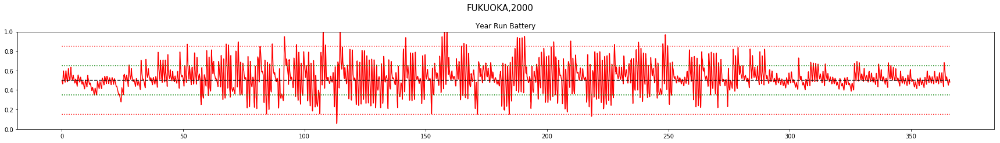



************************************
Day Violations           =      3
Battery Limit Violations =      4
Battery FULL Violations  =      3
Battery EMPTY Violations =      1


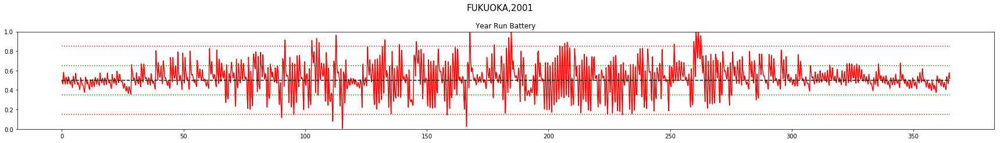



************************************
Day Violations           =      5
Battery Limit Violations =      9
Battery FULL Violations  =      8
Battery EMPTY Violations =      1


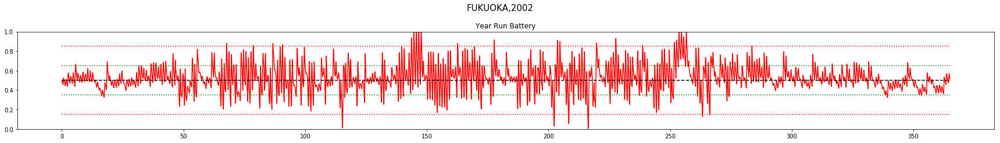



************************************
Day Violations           =      7
Battery Limit Violations =     24
Battery FULL Violations  =     24
Battery EMPTY Violations =      0


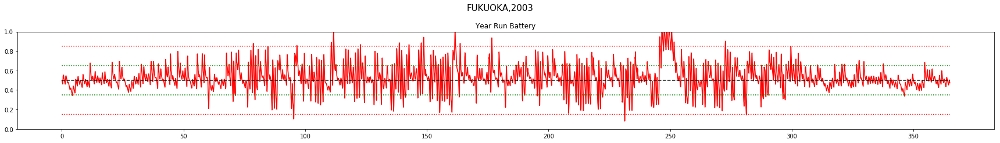



************************************
Day Violations           =      4
Battery Limit Violations =     12
Battery FULL Violations  =     12
Battery EMPTY Violations =      0


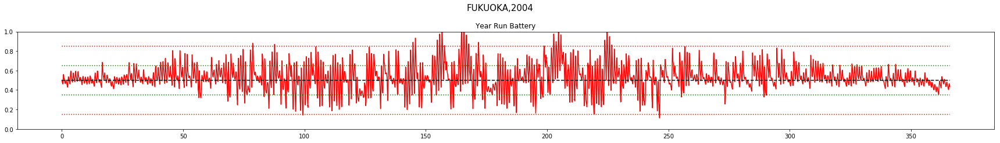



************************************
Day Violations           =     10
Battery Limit Violations =     32
Battery FULL Violations  =     30
Battery EMPTY Violations =      2


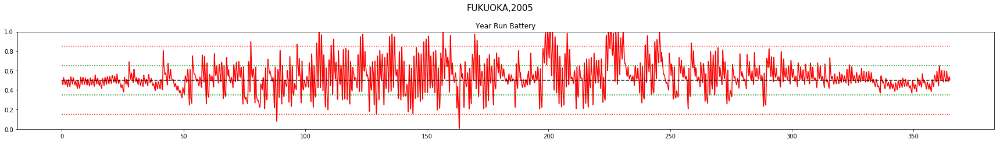



************************************
Day Violations           =     11
Battery Limit Violations =     26
Battery FULL Violations  =     21
Battery EMPTY Violations =      5


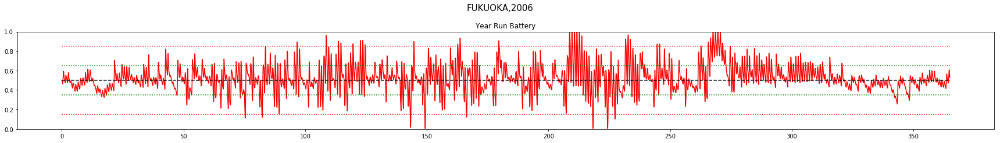



************************************
Day Violations           =      2
Battery Limit Violations =      5
Battery FULL Violations  =      5
Battery EMPTY Violations =      0


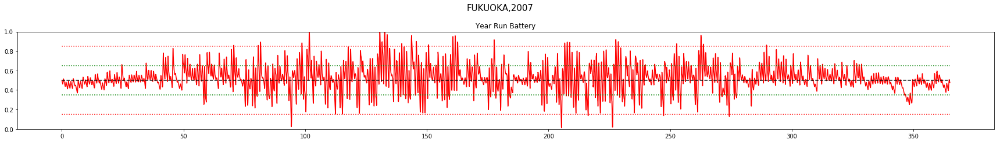



************************************
Day Violations           =      2
Battery Limit Violations =      4
Battery FULL Violations  =      4
Battery EMPTY Violations =      0


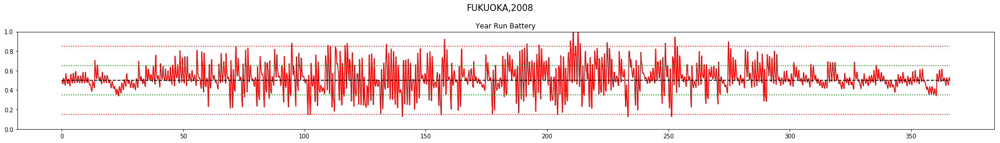



************************************
Day Violations           =      3
Battery Limit Violations =      8
Battery FULL Violations  =      6
Battery EMPTY Violations =      2


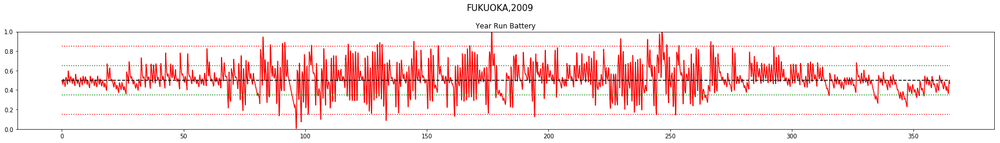



************************************
Day Violations           =      5
Battery Limit Violations =     11
Battery FULL Violations  =     10
Battery EMPTY Violations =      1


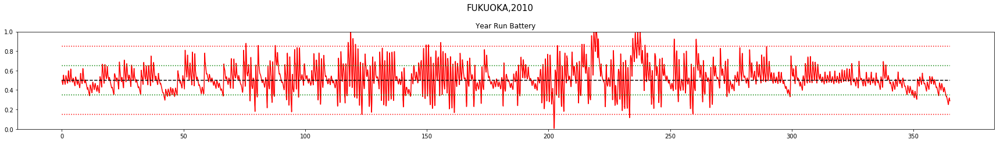



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


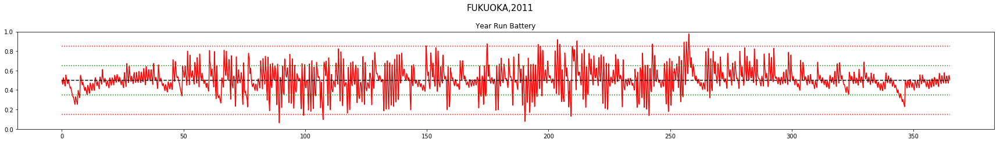



************************************
Day Violations           =      4
Battery Limit Violations =     18
Battery FULL Violations  =     18
Battery EMPTY Violations =      0


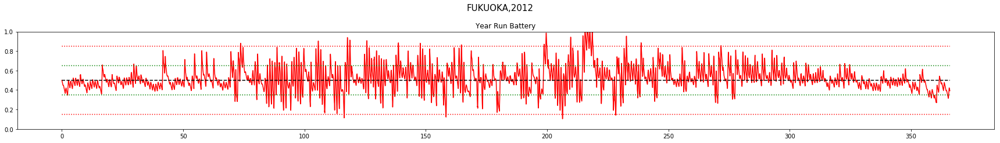



************************************
Day Violations           =     14
Battery Limit Violations =     46
Battery FULL Violations  =     43
Battery EMPTY Violations =      3


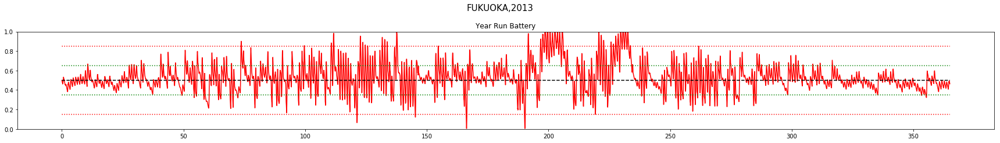



************************************
Day Violations           =      8
Battery Limit Violations =     25
Battery FULL Violations  =     20
Battery EMPTY Violations =      5


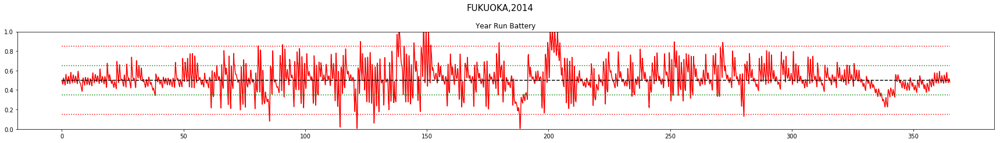



************************************
Day Violations           =      1
Battery Limit Violations =      3
Battery FULL Violations  =      0
Battery EMPTY Violations =      3


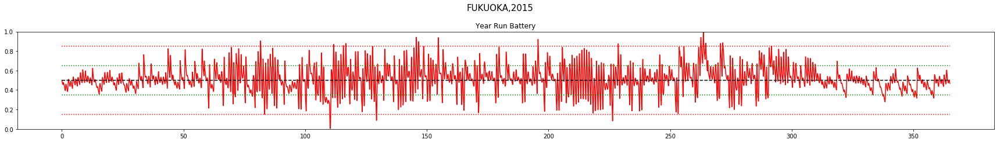



************************************
Day Violations           =      3
Battery Limit Violations =     50
Battery FULL Violations  =      0
Battery EMPTY Violations =     50


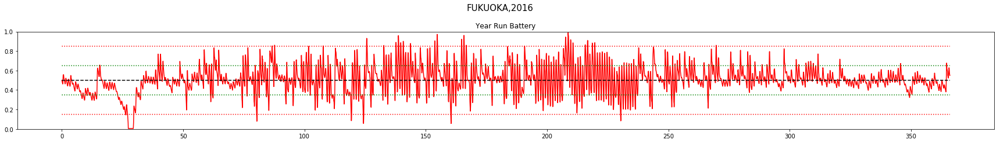



************************************
Day Violations           =      5
Battery Limit Violations =      9
Battery FULL Violations  =      1
Battery EMPTY Violations =      8


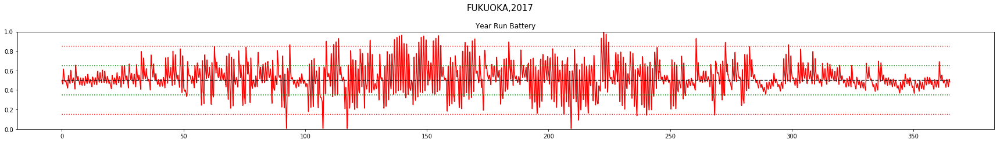



************************************
Day Violations           =      3
Battery Limit Violations =      8
Battery FULL Violations  =      8
Battery EMPTY Violations =      0


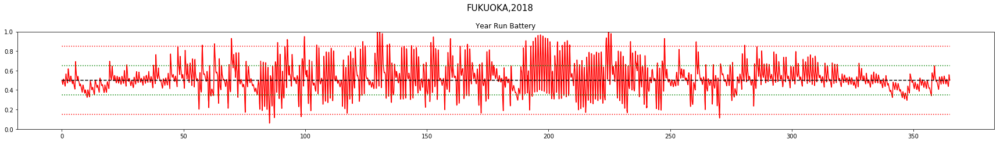



FUKUOKA
YEAR	AVG_RWD		VIOLATIONS	EMPTY	FULL
			DAY	BATT
2000	 0.99		1	 1	0	1
2001	 0.98		3	 4	1	3
2002	 0.98		5	 9	1	8
2003	 0.97		7	 24	0	24
2004	 0.98		4	 12	0	12
2005	 0.94		10	 32	2	30
2006	 0.96		11	 26	5	21
2007	 0.99		2	 5	0	5
2008	 0.99		2	 4	0	4
2009	 0.98		3	 8	2	6
2010	 0.97		5	 11	1	10
2011	 0.99		0	 0	0	0
2012	 0.98		4	 18	0	18
2013	 0.93		14	 46	3	43
2014	 0.95		8	 25	5	20
2015	 0.98		1	 3	3	0
2016	 0.97		3	 50	50	0
2017	 1.0		5	 9	8	1
2018	 0.99		3	 8	0	8

TOTAL Day  Violations:   91.0
TOTAL Batt  Violations:  295.0
TOTAL EMPTY Violations:  81.0
TOTAL FULL  Violations:  214.0
************************************


************************************
Day Violations           =      6
Battery Limit Violations =     12
Battery FULL Violations  =      7
Battery EMPTY Violations =      5


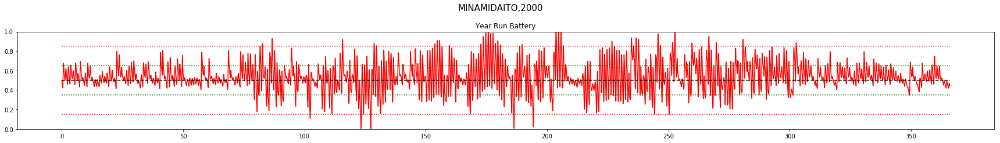



************************************
Day Violations           =      9
Battery Limit Violations =     30
Battery FULL Violations  =     29
Battery EMPTY Violations =      1


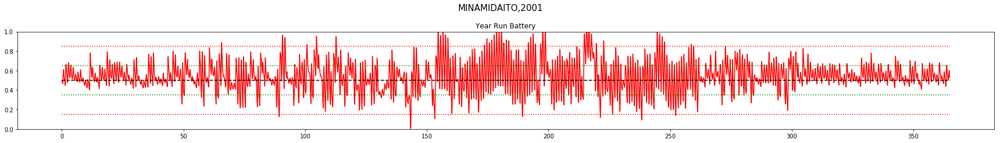



************************************
Day Violations           =     10
Battery Limit Violations =     23
Battery FULL Violations  =     21
Battery EMPTY Violations =      2


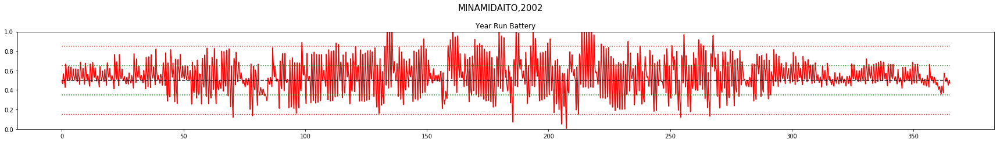



************************************
Day Violations           =     12
Battery Limit Violations =     30
Battery FULL Violations  =     30
Battery EMPTY Violations =      0


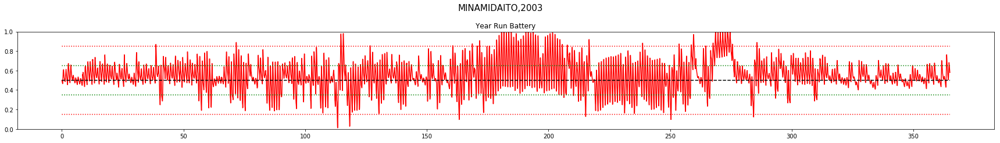



************************************
Day Violations           =      5
Battery Limit Violations =     11
Battery FULL Violations  =     11
Battery EMPTY Violations =      0


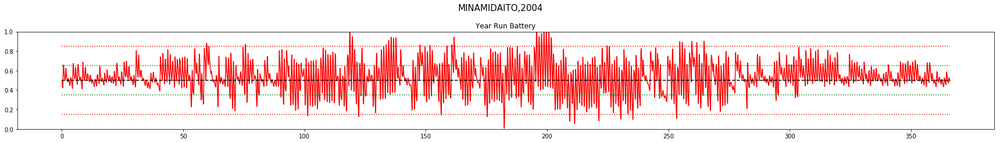



************************************
Day Violations           =      5
Battery Limit Violations =     68
Battery FULL Violations  =      8
Battery EMPTY Violations =     60


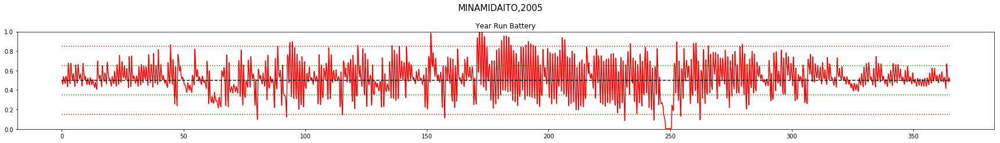



************************************
Day Violations           =     16
Battery Limit Violations =     51
Battery FULL Violations  =     51
Battery EMPTY Violations =      0


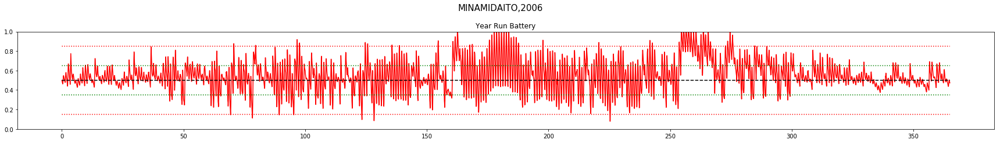



************************************
Day Violations           =      9
Battery Limit Violations =     18
Battery FULL Violations  =     18
Battery EMPTY Violations =      0


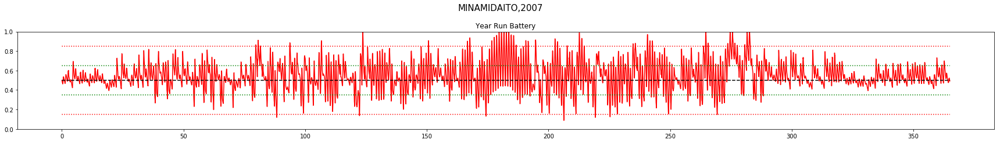



************************************
Day Violations           =     13
Battery Limit Violations =     44
Battery FULL Violations  =     44
Battery EMPTY Violations =      0


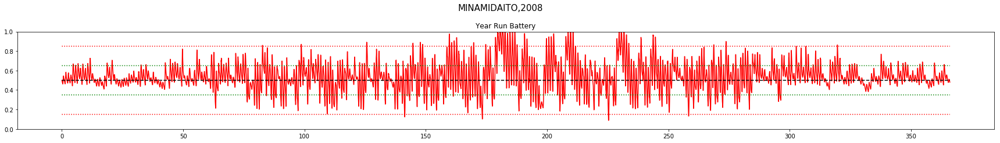



************************************
Day Violations           =     16
Battery Limit Violations =     59
Battery FULL Violations  =     59
Battery EMPTY Violations =      0


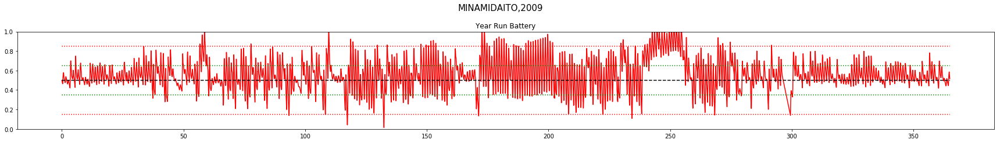



************************************
Day Violations           =     11
Battery Limit Violations =     23
Battery FULL Violations  =     23
Battery EMPTY Violations =      0


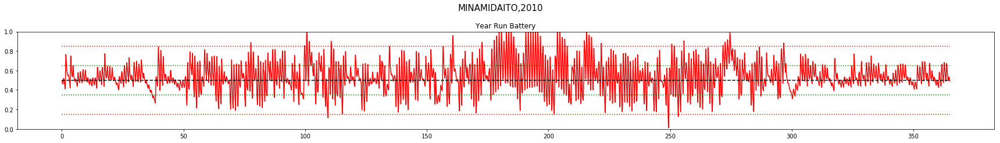



************************************
Day Violations           =      4
Battery Limit Violations =      8
Battery FULL Violations  =      7
Battery EMPTY Violations =      1


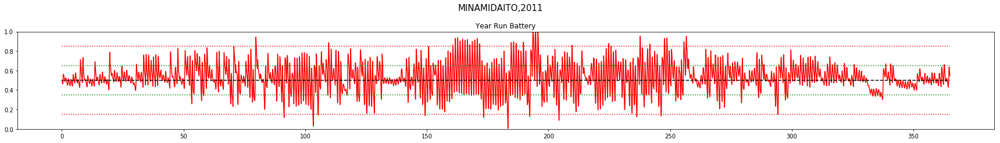



************************************
Day Violations           =      3
Battery Limit Violations =     49
Battery FULL Violations  =      0
Battery EMPTY Violations =     49


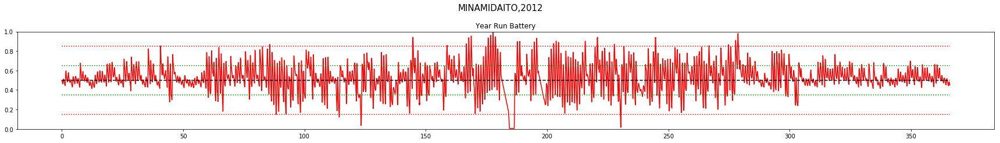



************************************
Day Violations           =      3
Battery Limit Violations =      7
Battery FULL Violations  =      5
Battery EMPTY Violations =      2


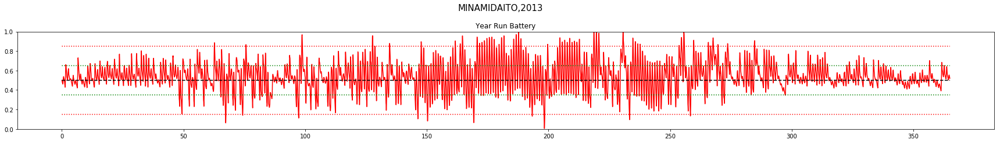



************************************
Day Violations           =      1
Battery Limit Violations =      2
Battery FULL Violations  =      2
Battery EMPTY Violations =      0


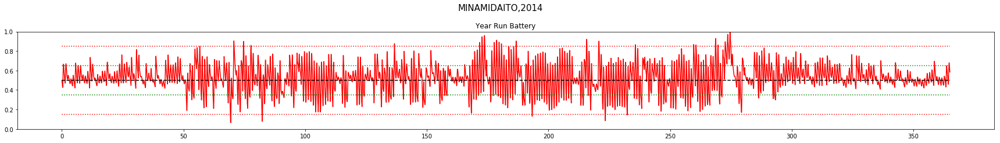



************************************
Day Violations           =      4
Battery Limit Violations =      8
Battery FULL Violations  =      8
Battery EMPTY Violations =      0


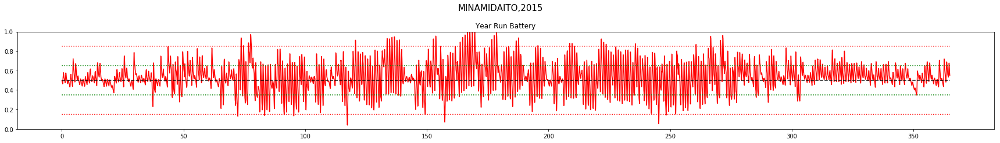



************************************
Day Violations           =      9
Battery Limit Violations =     23
Battery FULL Violations  =     23
Battery EMPTY Violations =      0


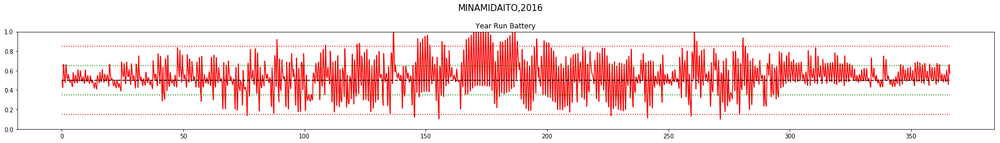



************************************
Day Violations           =      5
Battery Limit Violations =     12
Battery FULL Violations  =     12
Battery EMPTY Violations =      0


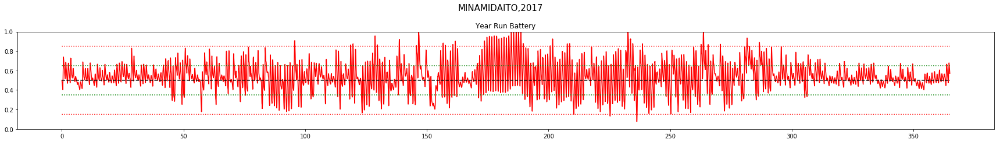



************************************
Day Violations           =      6
Battery Limit Violations =     16
Battery FULL Violations  =     12
Battery EMPTY Violations =      4


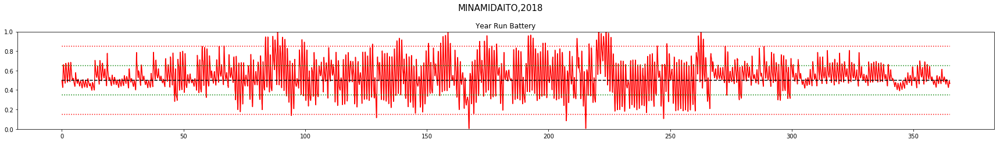



MINAMIDAITO
YEAR	AVG_RWD		VIOLATIONS	EMPTY	FULL
			DAY	BATT
2000	 0.97		6	 12	5	7
2001	 0.97		9	 30	1	29
2002	 0.97		10	 23	2	21
2003	 0.95		12	 30	0	30
2004	 0.98		5	 11	0	11
2005	 0.97		5	 68	60	8
2006	 0.92		16	 51	0	51
2007	 0.95		9	 18	0	18
2008	 0.95		13	 44	0	44
2009	 0.92		16	 59	0	59
2010	 0.96		11	 23	0	23
2011	 0.99		4	 8	1	7
2012	 0.98		3	 49	49	0
2013	 0.97		3	 7	2	5
2014	 0.99		1	 2	0	2
2015	 0.98		4	 8	0	8
2016	 0.97		9	 23	0	23
2017	 0.97		5	 12	0	12
2018	 0.97		6	 16	4	12

TOTAL Day  Violations:   147.0
TOTAL Batt  Violations:  494.0
TOTAL EMPTY Violations:  124.0
TOTAL FULL  Violations:  370.0
************************************


In [40]:
#VALIDATION PHASE
print("***MEASURING PERFORMANCE OF THE MODEL***")
for LOCATION in ['wakkanai','aomori','tokyo','fukuoka','minamidaito']:
    results = np.empty(6)
    for YEAR in np.arange(2000,2019):
        capm      = CAPM(LOCATION,YEAR,shuffle=False, trainmode=False) #instantiate the CAPM class
        capm.eno  = ENO(LOCATION,YEAR, shuffle=False, day_balance=False) #instantiate the environment inside the CAPM class
        capm.HMAX = capm.eno.SMAX #maximum power output of solar cell is set in CAPM object using the value in ENO object

        s, r, day_end, year_end = capm.reset()
        yr_test_record = np.empty(4)

        while True:
            a = dqn.choose_greedy_action(stdize(s))
            yr_test_record = np.vstack((yr_test_record, [s[0],s[2],r, a])) #record battery, henergy, reward and action
            s_, r, day_end, year_end = capm.step(a)
            if year_end:
                break
            s = s_

        yr_test_record = np.delete(yr_test_record, 0, 0) #remove the first row which is garbage
        yr_test_reward_rec = yr_test_record[:,2]
        yr_test_reward_rec = yr_test_reward_rec[::24] #annual average reward
        results = np.vstack((results, [int(YEAR), np.mean(yr_test_reward_rec), int(capm.violation_counter), int(capm.batt_violations), int(capm.batt_empty_counter), int(capm.batt_full_counter)]))
        print("\n\n************************************")
        print("Day Violations           = {:6d}".format(capm.violation_counter))
        print("Battery Limit Violations = {:6d}".format(capm.batt_violations))
        print("Battery FULL Violations  = {:6d}".format(capm.batt_full_counter))
        print("Battery EMPTY Violations = {:6d}".format(capm.batt_empty_counter))
    ###########################################################################################
    ###########################################################################################
        #     Plot the reward and battery for the entire year run
        title = LOCATION.upper() + ',' + str(YEAR)
        NO_OF_DAYS = capm.eno.NO_OF_DAYS

        fig = plt.figure(figsize=(24,6))
        fig.suptitle(title, fontsize=15)

    #         ax1 = fig.add_subplot(211)
    #         ax1.plot(yr_test_reward_rec)
    #         ax1.set_title("\n\nYear Run Reward")
    #         ax1.set_ylim([-4,2])

        ax2 = fig.add_subplot(211)
        ax2.plot(yr_test_record[:,0],'r')
        ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BOPT/capm.BMAX, 'k--')
        ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BLIM_LO/capm.BMAX, 'r:')
        ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BLIM_HI/capm.BMAX, 'r:')
        ax2.plot(np.ones_like(yr_test_record[:,0])*(capm.BOPT+capm.ENP_MARGIN /2) /capm.BMAX, 'g:')
        ax2.plot(np.ones_like(yr_test_record[:,0])*(capm.BOPT-capm.ENP_MARGIN/2)/capm.BMAX, 'g:')

        ax2.set_title("\n\nYear Run Battery")
        ax2.set_ylim([0,1])
        plt.sca(ax2)
        plt.xticks(np.arange(0, NO_OF_DAYS*24, 50*24),np.arange(0,NO_OF_DAYS,50))
        fig.tight_layout()
        plt.show()
    ###########################################################################################
    ###########################################################################################


    results = np.delete(results,0,0)
    print("\n")
    print(LOCATION.upper())
    print('YEAR\tAVG_RWD\t\tVIOLATIONS\tEMPTY\tFULL')
    print('\t\t\tDAY\tBATT')

    for x in np.arange(0,results.shape[0]):
        print('{}\t {}\t\t{}\t {}\t{}\t{}'.format(int(results[x,0]), np.around(results[x,1],2), int(results[x,2]), int(results[x,3]), int(results[x,4]),  int(results[x,5]) ))

    print("\nTOTAL Day  Violations:  ",np.sum(results[:, 2]))
    print("TOTAL Batt  Violations: ",np.sum(results[:,3]))
    print("TOTAL EMPTY Violations: ",np.sum(results[:,4]))
    print("TOTAL FULL  Violations: ",np.sum(results[:,5]))
    print("************************************")